
# Setup


In [1]:
%matplotlib inline

In [279]:
!pip install torch skorch scikit-learn
!pip install pvlib
!pip install pykrige

   ---------------------------------------- 0.0/29.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/29.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/29.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/29.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/29.5 MB 187.9 kB/s eta 0:02:37
   ---------------------------------------- 0.0/29.5 MB 196.9 kB/s eta 0:02:30
   ---------------------------------------- 0.1/29.5 MB 302.7 kB/s eta 0:01:38
   ---------------------------------------- 0.1/29.5 MB 532.5 kB/s eta 0:00:56
   ---------------------------------------- 0.3/29.5 MB 896.4 kB/s eta 0:00:33
    --------------------------------------- 0.4/29.5 MB 1.2 MB/s eta 0:00:26
    --------------------------------------- 0.5/29.5 MB 1.3 MB/s eta 0:00:23
    --------------------------------------- 0.6/29.5 MB 1.4 MB/s eta 0:00:21
   - -------------------------------------- 0.8/29.5 MB 1.7 MB/s eta 0:00:17
   - ------------

In [3]:
import sys
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import os
import json

import torch
import torch.nn as nn
import torch.optim as optim

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from datetime import date
from pvlib.iotools import read_epw


from pykrige.rk import RegressionKriging
from pykrige.ok import OrdinaryKriging

In [4]:
### directory Joie
#dir = '/content/drive/MyDrive/NUS Interpolation/'
### directory Ben
# dir = '/content/drive/MyDrive/NUS Interpolation BG/'
dir = 'C:\\Users\\59558\\Downloads\\NUS Interpolation-20231002T014936Z-001\\NUS Interpolation\\'


# Load, verify and process input files

In [163]:
amy['year'].astype('str')+amy['month'].astype('str')

1989-01-01 00:00:00+08:00     19891
1989-01-01 01:00:00+08:00     19891
1989-01-01 02:00:00+08:00     19891
1989-01-01 03:00:00+08:00     19891
1989-01-01 04:00:00+08:00     19891
                              ...  
1990-12-31 19:00:00+08:00    199012
1990-12-31 20:00:00+08:00    199012
1990-12-31 21:00:00+08:00    199012
1990-12-31 22:00:00+08:00    199012
1990-12-31 23:00:00+08:00    199012
Length: 8760, dtype: object

In [5]:
measureunit={"Tem0719":'°C',"RH0719":'%'}

In [6]:
measurenames={"RH0719":'RH',"Tem0719":'Temperature'}
measureunit={"Tem0719":'°C',"RH0719":'%'}
measure = "RH0719"
#measure = "Tem0719"
testmeasure = "RH0819"
#testmeasure = "Tem0819"
df = pd.read_csv(dir + measure +'.csv')
testdf = pd.read_csv(dir + testmeasure +'.csv')


# df = df.drop(df.index[2])

amy,meta=read_epw(dir+'SGP_Singapore.486980_IWEC.epw')
changi,meta=read_epw(dir+'SGP_SINGAPORE-CHANGI-AP_486980S_19.epw')
if measure == "Tem0719":
    mykey='temp_air'
else:
    mykey='relative_humidity'
changidata=changi.loc[(changi['year'].astype('str')+changi['month'].astype('str')=='20197'),[mykey]]
amydata=amy.loc[(amy['month'].astype('str')=='7'),[mykey]]

In [145]:
amydata

,relative_humidity
1999-07-01 00:00:00+08:00,90
1999-07-01 01:00:00+08:00,90
1999-07-01 02:00:00+08:00,90
1999-07-01 03:00:00+08:00,91
1999-07-01 04:00:00+08:00,92
...,...
1999-07-31 19:00:00+08:00,72
1999-07-31 20:00:00+08:00,75
1999-07-31 21:00:00+08:00,78
1999-07-31 22:00:00+08:00,81


In [7]:
windspeeddf = pd.read_csv(dir + 'ws0719.csv')
solardf = pd.read_csv(dir + 'sr0719.csv')

,Date,Time,WindSpeed_02,WindSpeed_03,WindSpeed_04,WindSpeed_06,WindSpeed_07,WindSpeed_08,WindSpeed_11,WindSpeed_12,WindSpeed_13,WindSpeed_16,WindSpeed_17,WindSpeed_18,WindSpeed_19,WindSpeed_20
0,01/08/19,00:00:00,0.0,0.0,0.0,0.0,0.0,0.8,1.2,0.0,0.2,0.4,0.0,0.0,0.2,0.0
1,01/08/19,00:01:00,0.2,0.0,0.0,0.0,0.0,0.8,0.8,0.0,0.2,0.4,0.0,0.2,0.2,0.0
2,01/08/19,00:02:00,0.2,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.8,0.2,0.0,0.2,0.2,0.2
3,01/08/19,00:03:00,0.0,0.2,0.2,0.0,0.0,0.8,0.6,0.0,0.8,0.8,0.0,0.4,0.2,0.2
4,01/08/19,00:04:00,0.0,0.2,0.0,0.0,0.0,1.0,0.8,0.0,0.8,0.6,0.0,0.0,0.2,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44635,31/08/19,23:55:00,0.0,0.0,0.0,0.0,0.0,0.6,0.2,0.2,0.2,0.0,0.0,0.4,0.0,0.4
44636,31/08/19,23:56:00,0.2,0.0,0.0,0.0,0.0,0.6,0.0,0.2,0.4,0.2,0.0,0.0,0.0,0.2
44637,31/08/19,23:57:00,0.0,0.0,0.2,0.2,0.0,0.6,0.4,0.0,0.4,0.2,0.0,0.0,0.0,0.4
44638,31/08/19,23:58:00,0.0,0.0,0.0,0.2,0.0,0.4,0.0,0.0,0.4,0.2,0.0,0.4,0.0,0.0


In [8]:
griddf = pd.read_csv(dir + '1m_GridPoints_distTo_and_zones_3414.csv').fillna(0)
wsdf = pd.read_csv(dir + 'WSPoints_TreesAndStreets_3414.csv').fillna(0)

t = pd.concat([griddf, pd.get_dummies(griddf.HorticultureZone)], axis=1)
t = t.replace("Temparea", 1)
t = t.replace("Vegetated Ridge", 1)
# t = t.replace("Valley", 1)
# t = t.rename(columns={"Area": "VegetatedRidge"})
### drop features that share high correlation with other features (not useful for prediction)
griddf = t.drop(['id','HorticultureZone'], axis=1)
# griddf = t.drop(['id','HorticultureZone','gridarea','buildingfootprintarea','roadarea','patharea','walkwayarea','courttrackarea','carparkarea'], axis=1)
### set points within VegetatedRidge to have distToTree 0.0 (trees within the area are not doccumented but the area is densely forrested)
### helps a bit to make distToTree useful but numtrees is still inaccurate for this area
griddf['distToTree'].loc[griddf['VegetatedRidge'] == 1] = 0.0

t = pd.concat([wsdf, pd.get_dummies(wsdf.HorticultureZone)], axis=1)
t = t.replace("Temparea", 1)
t = t.replace("Vegetated Ridge", 1)
t = t.replace("Valley", 1)
# t = t.rename(columns={"Area": "VegetatedRidge"})
t = t.sort_values(by=['ID'])
### drop features that share high correlation with other features (not useful for prediction)
wsdf = t.drop(['Lat','Long','HorticultureZone','Location','Type','Description','gridarea','buildingfootprintarea','roadarea','patharea','walkwayarea','courttrackarea','carparkarea'], axis=1)
wsdf = wsdf.reset_index(drop=True)

plotdf = testdf.transpose().iloc[2:16,:]
plotdf['X']=list(wsdf['X'])
plotdf['Y']=list(wsdf['Y'])

display(wsdf)
display(griddf.head())

C:\Users\59558\AppData\Local\Temp\ipykernel_16164\2444857737.py:1: DtypeWarning: Columns (10,11,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  griddf = pd.read_csv(dir + '1m_GridPoints_distTo_and_zones_3414.csv').fillna(0)
C:\Users\59558\AppData\Local\Temp\ipykernel_16164\2444857737.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  griddf['distToTree'].loc[griddf['VegetatedRidge'] == 1] = 0.0


,X,Y,ID,distToBuilding,percentbuilt,terrain,Area,Temparea,Valley,distToTree,...,percentroad,percentpath,percentwalkway,percentcourttrack,percentcarpark,numtrees,Zone 1,Zone 2,Zone 3,Zone 4
0,21310.45279,31360.82993,2,1.57015,17.48721,25.03599,0,1,1,0.00008,...,0.00000,14.85820,0.00000,0.000,0.00000,0,True,False,False,False
1,21042.23831,31242.52129,3,0.68151,37.08572,47.24897,0,0,1,0.00043,...,32.90080,0.00000,0.00000,0.000,0.00000,0,True,False,False,False
2,21251.46471,31202.70922,4,5.49422,45.78975,42.84434,0,0,1,0.00005,...,0.00000,32.10427,0.00000,0.000,0.00000,0,True,False,False,False
3,21210.28151,30976.03165,6,2.84506,39.82353,40.05906,0,0,0,0.00008,...,28.49887,26.57608,6.61014,0.000,0.00000,0,False,True,False,False
4,20933.16250,30824.55084,7,9.90256,0.00000,18.97783,0,0,0,0.00002,...,0.00000,0.00000,0.00000,0.000,0.00000,1,False,False,False,True
5,21188.01955,30822.33307,8,0.00000,55.52813,47.79486,0,0,1,0.00007,...,0.00000,0.00000,0.00000,0.000,0.00000,1,False,False,False,True
6,21254.80024,31068.91350,11,0.00000,9.38553,47.58942,0,0,1,0.00005,...,2.45925,1.77000,15.15244,0.000,22.41425,3,True,False,False,False
7,21908.06866,30561.35985,12,10.52352,15.75304,33.60504,1,0,0,0.00015,...,0.00000,0.00000,0.00000,0.000,0.00000,0,False,True,False,False
8,22150.68034,30388.85790,13,19.30173,0.00000,35.78543,0,1,0,0.00019,...,73.29213,0.00000,1.47421,0.000,0.00000,0,False,True,False,False
9,22196.31786,30779.18631,16,21.65002,0.00000,41.24351,0,0,0,0.00007,...,0.00000,0.00000,0.00000,0.000,97.22544,1,False,False,True,False


,X,Y,distToBuilding,distToCarpark,distToCourtTrack,distToPath,distToRoad,distToWalkway,distToTree,LOTKEY,VegetatedRidge,TempArea,terrain,0,Zone 1,Zone 3
0,21211.76,31449.25,35.13702,40.96888,5.76221,32.17034,22.79395,21.34219,0.00009,MK03-05112L,0,TempArea,24.44757,False,True,False
1,21211.76,31448.25,34.28551,40.84101,6.46347,31.29244,22.37293,20.91852,0.00008,MK03-05112L,0,TempArea,25.59470,False,True,False
2,21211.76,31447.25,33.44222,40.73729,6.01520,30.41453,21.95191,20.49564,0.00007,MK03-05112L,0,TempArea,25.59470,False,True,False
3,21211.76,31446.25,32.60780,40.64762,5.70867,29.53662,21.53089,20.07277,0.00006,MK03-05112L,0,TempArea,25.59470,False,True,False
4,21211.76,31445.25,31.78293,40.55804,5.56732,28.66267,21.10987,19.64989,0.00006,MK03-05112L,0,TempArea,25.59470,False,True,False


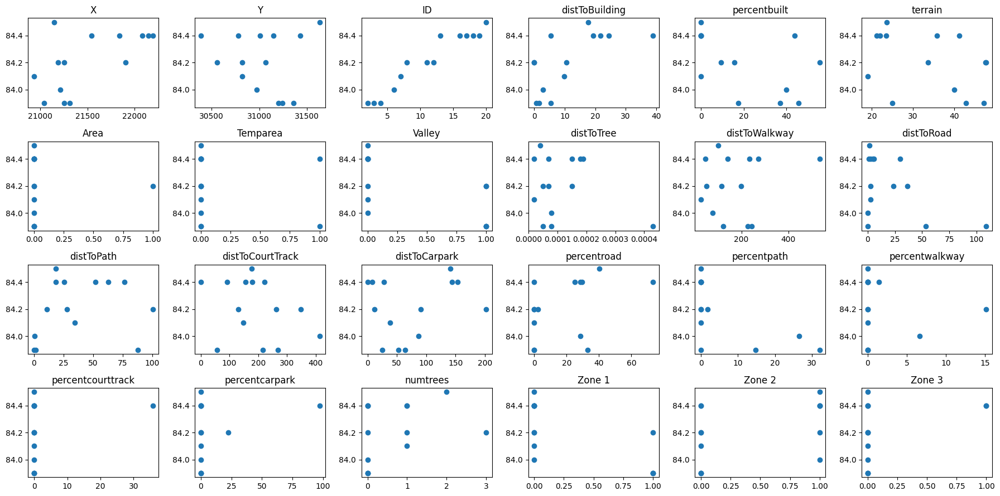

In [147]:
### Plot scatterplot of each feature against average Tmax (weather station data, using Mar-19)
fig, axs = plt.subplots(4, 6, figsize = (18, 9))

for i in range(4):
    for j in range(6):
        k = i * 6 + j
        if k >= len(wsdf.columns):
            break
        
        axs[i][j].scatter(wsdf[wsdf.columns[k]], df.iloc[2:16,3])
        axs[i][j].set_title(wsdf.columns[k])

fig.tight_layout()
plt.show()

In [9]:
percentfeatures=['percentroad','percentpath','percentwalkway','percentcourttrack','percentcarpark']
features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
wsdf.corr().loc[features,features]

,terrain,distToBuilding,distToTree,distToWalkway,distToRoad,distToPath,distToCourtTrack,distToCarpark
terrain,1.000000,-0.521091,0.259526,0.220098,0.033307,-0.063399,0.630428,-0.133655
distToBuilding,-0.521091,1.000000,0.091434,0.176257,-0.281144,0.094528,-0.658276,0.328026
distToTree,0.259526,0.091434,1.000000,0.369210,-0.210435,0.493273,-0.094184,0.279062
distToWalkway,0.220098,0.176257,0.369210,1.000000,-0.012296,0.239006,-0.221726,0.120337
distToRoad,0.033307,-0.281144,-0.210435,-0.012296,1.000000,-0.315642,-0.302926,-0.147747
distToPath,-0.063399,0.094528,0.493273,0.239006,-0.315642,1.000000,-0.097853,0.113661
distToCourtTrack,0.630428,-0.658276,-0.094184,-0.221726,-0.302926,-0.097853,1.000000,-0.367240
distToCarpark,-0.133655,0.328026,0.279062,0.120337,-0.147747,0.113661,-0.367240,1.000000


<Axes: >

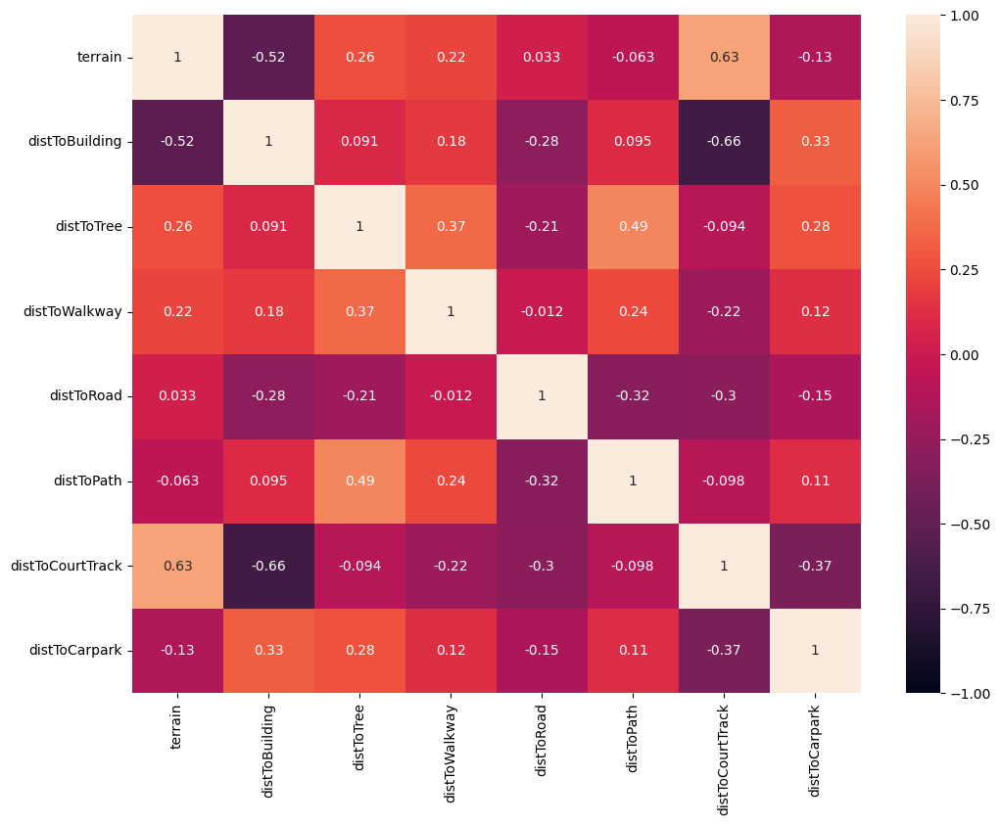

In [8]:
### Plot feature correlations
f,ax = plt.subplots(figsize = (12, 9))
sns.heatmap(wsdf.corr().loc[features,features],vmin = -1,annot = True, ax = ax)
#plt.title('Correlation matrix of LULC features', size=35)

# Regression kriging

In [10]:
scores_all = [["kernel","C","gamma","n_closest_points","Feb-19","Mar-19","Apr-19","May-19","Jun-19","Jul-19","Aug-19","Sep-19","Oct-19","Nov-19","Dec-19","Jan-20","Feb-20","Mar-20","Apr-20","Average"]]

In [393]:
wsdf.keys()

Index(['X', 'Y', 'ID', 'distToBuilding', 'percentbuilt', 'terrain', 'Area',
       'Temparea', 'Valley', 'distToTree', 'distToWalkway', 'distToRoad',
       'distToPath', 'distToCourtTrack', 'distToCarpark', 'percentroad',
       'percentpath', 'percentwalkway', 'percentcourttrack', 'percentcarpark',
       'numtrees', 'Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'cluster'],
      dtype='object')

In [9]:
np.array(list(zip(wsdf.X, wsdf.Y)))
wsdf[features]
df.transpose()

,0,1,2,3,4,5,6,7,8,9,...,44630,44631,44632,44633,44634,44635,44636,44637,44638,44639
Date,01/07/19,01/07/19,01/07/19,01/07/19,01/07/19,01/07/19,01/07/19,01/07/19,01/07/19,01/07/19,...,31/07/19,31/07/19,31/07/19,31/07/19,31/07/19,31/07/19,31/07/19,31/07/19,31/07/19,31/07/19
Time,00:00:00,00:01:00,00:02:00,00:03:00,00:04:00,00:05:00,00:06:00,00:07:00,00:08:00,00:09:00,...,23:50:00,23:51:00,23:52:00,23:53:00,23:54:00,23:55:00,23:56:00,23:57:00,23:58:00,23:59:00
Temperature_02,27.92,27.92,27.95,27.92,27.9,27.87,27.87,27.9,27.87,27.87,...,27.53,27.55,27.58,27.6,27.6,27.6,27.63,27.63,27.6,27.6
Temperature_03,28.42,28.42,28.39,28.39,28.42,28.39,28.39,28.39,28.37,28.34,...,28.15,28.15,28.15,28.15,28.15,28.15,28.15,28.15,28.15,28.17
Temperature_04,28.25,28.25,28.22,28.25,28.22,28.22,28.22,28.22,28.22,28.22,...,28.02,28.0,28.0,28.0,28.0,28.0,28.0,28.0,27.97,27.97
Temperature_06,27.92,27.95,27.95,27.97,28.0,27.97,27.97,27.92,27.9,27.85,...,27.68,27.63,27.63,27.6,27.58,27.55,27.53,27.53,27.51,27.51
Temperature_07,27.55,27.53,27.53,27.51,27.51,27.48,27.46,27.43,27.43,27.41,...,27.28,27.26,27.21,27.19,27.16,27.11,27.09,27.06,27.06,27.04
Temperature_08,27.92,27.9,27.92,27.92,27.95,27.92,27.92,27.92,27.95,27.95,...,27.6,27.6,27.6,27.6,27.6,27.6,27.6,27.63,27.63,27.6
Temperature_11,27.85,27.87,27.85,27.85,27.83,27.83,27.83,27.8,27.8,27.8,...,27.58,27.55,27.55,27.53,27.55,27.55,27.58,27.58,27.55,27.53
Temperature_12,26.74,26.72,26.7,26.67,26.67,26.67,26.62,26.6,26.55,26.55,...,25.96,25.99,25.94,26.01,26.01,25.96,25.94,25.91,25.91,25.89


In [10]:
allstations=np.array(range(14))
targetstationid=7
otherstationsid=np.delete(allstations,targetstationid).tolist()

In [391]:
import torch.nn as nn
from torch.autograd import Variable

percentfeatures=['percentroad','percentpath','percentwalkway','percentcourttrack','percentcarpark']

class MyModel(nn.Module):
    def __init__(self, embedding_length, hidden_size,output_size,batch_size):
        self.hidden_size = hidden_size
        self.batch_size = batch_size
        super(MyModel, self).__init__()
        self.lstm = nn.LSTM(embedding_length, hidden_size,batch_first=True)
        self.label = nn.Linear(hidden_size, output_size)
    def forward(self, input):
        h_0 = Variable(torch.zeros(1,self.batch_size, self.hidden_size))
        c_0 = Variable(torch.zeros(1,self.batch_size, self.hidden_size))
        output, (final_hidden_state, final_cell_state) = self.lstm(input, (h_0, c_0))
        return self.label(final_hidden_state[-1]) 
class gru(nn.Module):
    def __init__(self, embedding_length, hidden_size,output_size,batch_size):
        self.hidden_size = hidden_size
        self.batch_size = batch_size
        super(gru, self).__init__()
        self.lstm = nn.GRU(embedding_length, hidden_size,batch_first=True)
        self.label = nn.Linear(hidden_size, output_size)
    def forward(self, input):
        h_0 = Variable(torch.zeros(1,self.batch_size, self.hidden_size))
        
        output, final_hidden_state = self.lstm(input, h_0)
        return self.label(final_hidden_state[-1]) 

embedding_length=15
batchsize=16
mymodel=gru(embedding_length=embedding_length,hidden_size=64,output_size=13,batch_size=batchsize)
optimizer = torch.optim.SGD(mymodel.parameters(), lr=0.01, momentum=0.9)

def train_model(model, train_iter, epoch):
    model.train()
    for e in range(epoch):
        loss=0
        optimizer.zero_grad()
        for idx, batch in enumerate(train_iter):
            prediction = model(batch.x)
            loss = loss + torch.norm(prediction-batch.y,"fro")
        loss=loss/(idx+1)
        print("epoch {}: Training Loss normalized Root MSE : {} %".format(e,np.sqrt(loss.detach().numpy())) )
        loss.backward()
        optimizer.step()
        if loss <0.1:
            break
    return loss

class Mydata():
    def __init__(self,x,y):
        self.x=x
        self.y=y

measure='Tem0719'
npdata=np.array(pd.read_csv(dir + measure +'.csv').iloc[:,2:16])
hourdata=np.sum(npdata.reshape([-1,60,14]),axis=1)/60
testhourdata=np.sum(np.array(testdf.iloc[:,2:16]).reshape([-1,60,14]),axis=1)/60
mean = hourdata.mean()
std = hourdata.std()
pdhourdata=pd.DataFrame(hourdata).transpose()
pdhourdata['X']=list(wsdf['X'])
pdhourdata['Y']=list(wsdf['Y'])
#if batchsize ==1:
#    for i in range(0,df.shape[0]-embedding_length-batchsize,batchsize):
#        data.append(Mydata(torch.tensor(np.array(df.iloc[i:i+embedding_length,2:16]-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor(np.array(df.iloc[i+embedding_length:i+1+embedding_length,2:16]-mean)/std,dtype=torch.float32)))
#else:
#    for i in range(0,df.shape[0]-embedding_length-batchsize,batchsize):
#        data.append(Mydata(torch.tensor(np.array([np.array(df.iloc[i+k:i+k+embedding_length,2:16]-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
#                    ,torch.tensor(np.array(df.iloc[i+embedding_length:i+batchsize+embedding_length,2:16]-mean)/std,dtype=torch.float32)))

    

In [392]:
std


2.059538674578702

In [12]:
#print(np.sum(npdata.reshape([-1,60,14]),axis=1)/60)
#data[0].y
#torch.tensor(np.array([np.array(df.iloc[i+k:i+k+embedding_length,2:16]-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
#Mydata(torch.tensor(np.array([np.array(df.iloc[i+k:i+k+embedding_length,2:16]-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
#,torch.tensor(np.array(df.iloc[i+embedding_length:i+batchsize+embedding_length,2:16]-mean)/std,dtype=torch.float32))
#data[mth].x[0,j,:].detach().numpy()
#np.delete(hourdata[i:i+embedding_length,:],targetstationid,axis=1).shape
import pickle
#with open('TEMmodel.pkl', 'rb') as f:
#    clf2 = pickle.load(f)
#with open('TEMmodel_target{}.pkl'.format(targetstationid),'wb') as f:
#    pickle.dump(mymodel,f)
#mymodel=clf2




No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Starting Date : 09/07/19, Time : 00:00:00
Starting Date : 21/07/19, Time : 16:00:00
Starting Date : 04/07/19, Time : 08:00:00


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


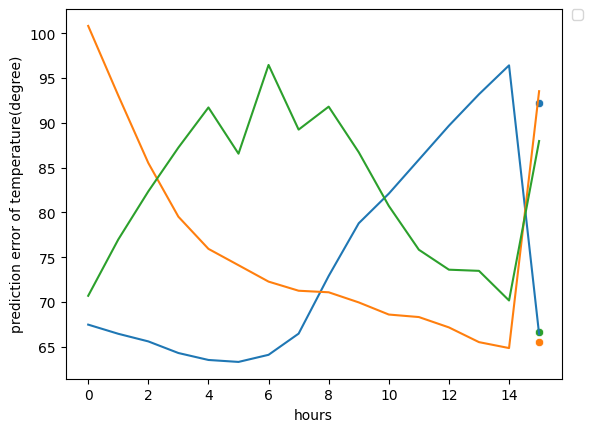

In [149]:
#torch.norm(mymodel(data[0].x)-data[0].y)
months = [12,31,5]
#train_model(mymodel,data,1)
#mymodel(data[0].x)-data[0].y
#mymodel(data[mth-embedding_length].x)[0,:].detach().numpy()*std+mean
for i, mth in enumerate(months):
    print("Starting Date : {}, Time : {}".format(df.iloc[mth*batchsize*60,0],df.iloc[mth*batchsize*60,1]))

    
    truevalue = testhourdata[mth*batchsize+embedding_length,:]
    myvalue = mymodel(testdata[mth].x)[0,:].detach().numpy()*std+mean
    # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
    #     p, x, target, test_size=0.3, random_state=42
    # )

    print("=" * 40)
    # m_rk.fit(p_train, x_train,target_train)
    # score = m_rk.score(p_test, x_test,target_test)
    # scores_mths.append(score)
    for j in range(14):
        if j == 7:
            ploty=np.zeros((embedding_length+1,))
            ploty[0:embedding_length]=testdata[mth].x[0,j,:].detach().numpy()*std+mean
            ploty[embedding_length]=truevalue[j]
            sns.lineplot(x=range(embedding_length+1), y=ploty)
            sns.scatterplot(x=[embedding_length], y=myvalue[j])
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.xlabel('hours')
    plt.ylabel('prediction error of temperature(degree)')

In [379]:
griddf.loc[i,'X']

21271.76

In [389]:
std

9.75927485187117

In [35]:
plotdf[measure+'_ne_']

Temperature_02    0.0
Temperature_03    0.0
Temperature_04    0.0
Temperature_06    0.0
Temperature_07    0.0
Temperature_08    0.0
Temperature_11    0.0
Temperature_12    0.0
Temperature_13    0.0
Temperature_16    0.0
Temperature_17    0.0
Temperature_18    0.0
Temperature_19    0.0
Temperature_20    0.0
Name: Tem0719_ne_, dtype: float64

In [34]:
plotdf[measure+'_ne_']=0.0
for i, mth in enumerate(range(len(data))):
    for batchindex in range(batchsize):
        lastdayvalue = hourdata[mth*batchsize+batchindex+embedding_length-24,:]
        #plotdf.loc[mth*batchsize+batchindex,measure+'_ne_']= lastdayvalue[otherstationsid[np.argmin((wsdf.loc[otherstationsid,'X']-wsdf.loc[targetstationid,'X'])**2+(wsdf.loc[otherstationsid,'Y']-wsdf.loc[targetstationid,'Y'])**2)]]-truevalue[targetstationid]


In [331]:
errormatrix.shape

(14, 720)

In [409]:
lulcclu = KMeans(n_clusters=nclu, random_state=0, n_init="auto").fit(wsdf[features])
tmpclusterresult=lulcclu.transform(wsdf[features])
lulcclusterresult=tmpclusterresult/np.sum(tmpclusterresult,axis=1,keepdims=True)
lulcclusterresult

array([[0.11257692, 0.28249173, 0.40681515, 0.1981162 ],
       [0.26408844, 0.2112395 , 0.42876408, 0.09590798],
       [0.25216984, 0.25451815, 0.40956993, 0.08374208],
       [0.25940738, 0.06408647, 0.45863195, 0.2178742 ],
       [0.1133848 , 0.19533522, 0.49340984, 0.19787013],
       [0.19299048, 0.11013328, 0.53019925, 0.16667699],
       [0.24419702, 0.05481063, 0.4980701 , 0.20292225],
       [0.15043709, 0.29456209, 0.3529559 , 0.20204492],
       [0.33235348, 0.39867957, 0.        , 0.26896695],
       [0.25975076, 0.30475222, 0.36062789, 0.07486913],
       [0.20284236, 0.18193598, 0.51217767, 0.10304399],
       [0.09816863, 0.27855222, 0.38510945, 0.2381697 ],
       [0.2151671 , 0.30777154, 0.40191652, 0.07514484],
       [0.09517424, 0.20920196, 0.49616873, 0.19945507]])

In [332]:
errormatrix=np.array(puredata['Tem0719_lstmrk_'])
errormatrix=errormatrix[:,8:-16]
tmperror=errormatrix.reshape(-1,24)
tmperror[61,:]-errormatrix[2,24:48]

from sklearn.cluster import KMeans
nclu=4
kmeans = KMeans(n_clusters=nclu, random_state=0, n_init="auto").fit(tmperror)
tmpclusterresult=kmeans.labels_.reshape(14,-1)
clusterresult=np.zeros((14,nclu))
for i in range(14):
    for j in range(nclu):   
        clusterresult[i,j]=np.sum(tmpclusterresult[i,:]==j)

clusterresult=clusterresult/tmpclusterresult.shape[1]
wsdf['cluster']=list(clusterresult)

In [453]:
errormatrix=np.array(puredata['Tem0719_lstmrk_'])
errormatrix=errormatrix[:,8:-16]
#pcaxy=pca.fit_transform(errormatrix)
pcaxy=pca.fit_transform((wsdf[features]-wsdf[features].mean())/wsdf[features].std())

In [418]:

from sklearn.cluster import KMeans
kmeans2 = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(wsdf[features]/wsdf[features].std())
kmeans2.labels_
np.mean(np.array(df.drop(columns=['Date','Time']).loc[0:43199,'Temperature_12']).reshape(-1,60,1),axis=1).transpose().reshape(-1,24)

array([1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0])

In [420]:
kmeans2.labels_==1

array([ True, False,  True,  True,  True,  True,  True, False, False,
        True,  True, False, False, False])

In [767]:
df

,Date,Time,RH_02,RH_03,RH_04,RH_06,RH_07,RH_08,RH_11,RH_12,RH_13,RH_16,RH_17,RH_18,RH_19,RH_20
0,01/07/19,00:00:00,86.1,83.8,83.1,86.3,88.0,85.8,86.4,92.9,83.2,83.8,80.9,86.9,84.5,84.7
1,01/07/19,00:01:00,86.5,83.8,83.3,86.2,88.2,86.0,86.4,92.8,83.2,83.8,80.6,87.0,84.3,84.7
2,01/07/19,00:02:00,86.5,83.9,83.3,86.2,88.1,86.0,86.4,93.1,83.3,83.9,80.6,87.1,84.4,84.9
3,01/07/19,00:03:00,86.4,83.9,83.5,86.3,88.2,86.0,86.5,92.9,83.2,84.1,80.9,87.1,84.5,85.0
4,01/07/19,00:04:00,86.5,83.9,83.5,86.1,88.3,86.0,86.5,93.2,83.3,84.2,81.0,87.2,84.4,85.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44635,31/07/19,23:55:00,79.1,76.5,76.3,79.2,81.2,78.3,78.9,87.0,75.0,76.2,73.4,79.9,78.2,77.8
44636,31/07/19,23:56:00,79.0,76.6,76.4,79.4,81.2,78.3,78.8,87.2,75.0,76.1,73.4,80.0,78.1,77.7
44637,31/07/19,23:57:00,78.9,76.5,76.4,79.4,81.2,78.3,78.8,87.3,75.0,76.3,73.5,80.0,78.1,77.8
44638,31/07/19,23:58:00,79.2,76.5,76.5,79.5,81.4,78.3,78.8,87.1,75.1,76.5,73.8,80.0,78.3,77.6


In [768]:
df = pd.read_csv(dir + measure +'.csv')
date=15
time=14
tmparray=np.array(df.drop(columns=['Date','Time']).loc[60*(date*24+time):60*(date*24+time)+59,:])

In [771]:
for i, ay in enumerate(tmparray.transpose()):
    print(ay.shape)

(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)
(60,)


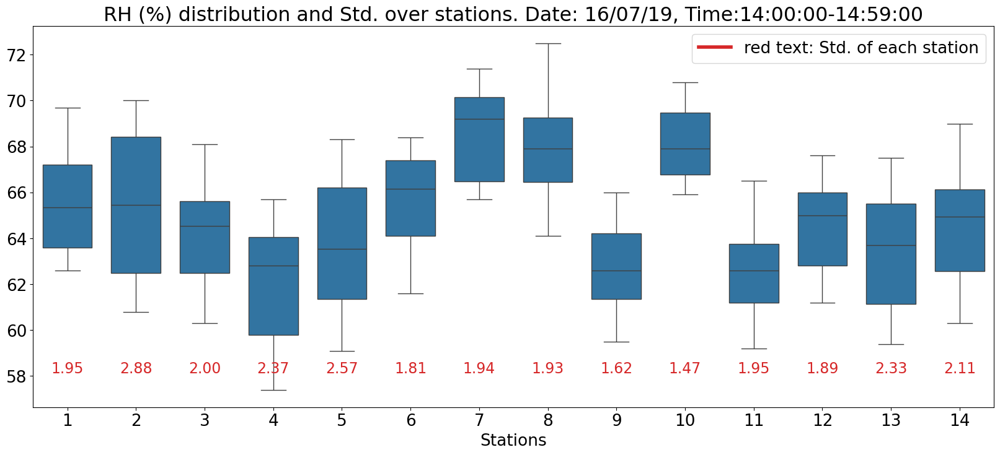

In [16]:
measure='RH0719'
#measure='Tem0719'
plt.rcParams.update({'font.size': 19})
df = pd.read_csv(dir + measure +'.csv')
date=15
time=14
tmparray=np.array(df.drop(columns=['Date','Time']).loc[60*(date*24+time):60*(date*24+time)+59,:])
#tmparray2=np.mean(np.array(df.drop(columns=['Date','Time']).loc[0:43199,'RH_12']).reshape(-1,60,1),axis=1).transpose().reshape(-1,24)
#tmplist=['Other stations','Station 8']
colorpal=sns.color_palette("tab10")
fig, axes = plt.subplots(1, 1, figsize=(20, 8), sharex=True)
ax=axes
plottempdf=None
stdtmp=[]
for i, ay in enumerate(tmparray.transpose()):
    tempdf=pd.DataFrame(data=ay.reshape(-1,1))
    stdtmp.append(ay.std())
    tempdf['Stations']=i+1
    #tempdf['time']=list(range(24))*ay.shape[0]
    if plottempdf is None:
        plottempdf=tempdf.copy()
    else:
        plottempdf=pd.concat([plottempdf,tempdf])
for j in range(len(stdtmp)):
    ax.text(j,58,'%.2f' % (stdtmp[j]),ha='center',va='bottom',color=colorpal[3],fontsize=17)
    #ax.text(j,31,'%.2f' % (stdtmp[j]),ha='center',va='bottom',color=colorpal[3],fontsize=17)
    #ax.axvline(4*j+3.5,color='black')
#for clusterid,ax in enumerate(axes):
sns.boxplot(gap=0.1,x='Stations',y=0,data = plottempdf, ax=ax,fliersize=1) 
#sns.boxplot(tmparray, ax=ax,fliersize=1,color=colorpal[0]) 
#sns.boxplot(gap=0.1,x='time',y=0,vue='method',color=colorpal,data = np.array(puredata[measure+method]).reshape(-1,24), ax=ax) 
#sns.boxplot(data = puredata_[plotdf['cluster']==clusterid].to_numpy().reshape(-1,24), ax=ax) 
#ax.set_ylim([-25,20])
ax.set_ylabel('')#("(unit:{})".format(measureunit[measure])) 
ax.set_title("{} ({}) distribution and Std. over stations. Date: {}, Time:{}-{}".format(measurenames[measure],measureunit[measure],df.loc[60*(date*24+time),'Date'],df.loc[60*(date*24+time),'Time'],df.loc[60*(date*24+time)+59,'Time'])) 
#if ax != axes[-1]: 
#    ax.set_xlabel('')
#else:
ax.set_xlabel("Stations")
colors=sns.color_palette()
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=colors[3], lw=4)]
ax.legend(custom_lines, ['red text: Std. of each station'])

Text(0.5, 0, 'Hour in the day')

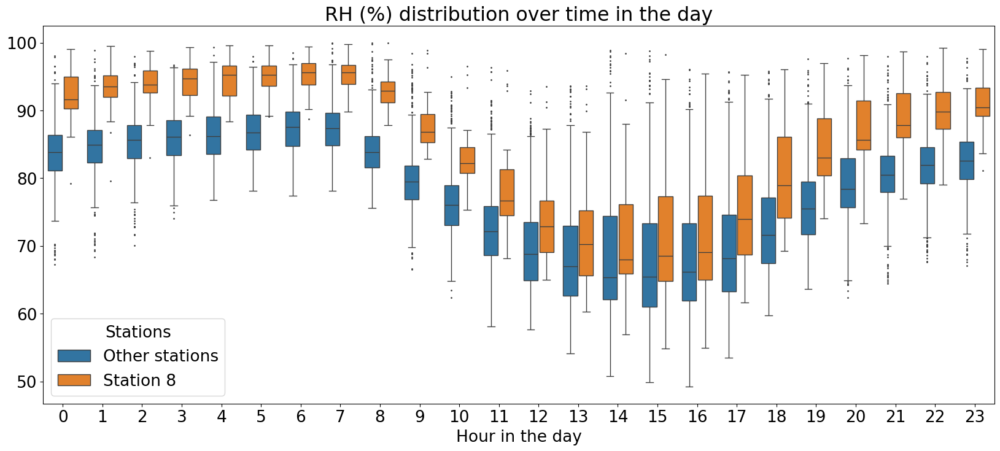

In [37]:
measure='RH0719'
df = pd.read_csv(dir + measure +'.csv')
tmparray=np.mean(np.array(df.drop(columns=['Date','Time','RH_12']).loc[0:43199,:]).reshape(-1,60,13),axis=1).transpose().reshape(-1,24)
tmparray2=np.mean(np.array(df.drop(columns=['Date','Time']).loc[0:43199,'RH_12']).reshape(-1,60,1),axis=1).transpose().reshape(-1,24)
tmplist=['Other stations','Station 8']
colorpal=sns.color_palette("tab10")
fig, axes = plt.subplots(1, 1, figsize=(20, 8), sharex=True)
ax=axes
plottempdf=None
for i, ay in enumerate([tmparray,tmparray2]):
    tempdf=pd.DataFrame(data=ay.reshape(-1,1))
    tempdf['Stations']=tmplist[i]
    tempdf['time']=list(range(24))*ay.shape[0]
    if plottempdf is None:
        plottempdf=tempdf.copy()
    else:
        plottempdf=pd.concat([plottempdf,tempdf])
#for clusterid,ax in enumerate(axes):
sns.boxplot(gap=0.1,x='time',y=0,hue='Stations',data = plottempdf, ax=ax,fliersize=1) 
#sns.boxplot(tmparray, ax=ax,fliersize=1,color=colorpal[0]) 
#sns.boxplot(gap=0.1,x='time',y=0,vue='method',color=colorpal,data = np.array(puredata[measure+method]).reshape(-1,24), ax=ax) 
#sns.boxplot(data = puredata_[plotdf['cluster']==clusterid].to_numpy().reshape(-1,24), ax=ax) 
#ax.set_ylim([-25,20])
ax.set_ylabel('')#("(unit:{})".format(measureunit[measure])) 
ax.set_title("{} ({}) distribution over time in the day".format(measurenames[measure],measureunit[measure])) 
#if ax != axes[-1]: 
#    ax.set_xlabel('')
#else:
ax.set_xlabel("Hour in the day")


array([[0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.89655172, 0.        , 0.10344828],
       [0.        , 0.55172414, 0.31034483, 0.13793103],
       [0.        , 0.        , 0.17241379, 0.82758621],
       [0.        , 0.03448276, 0.5862069 , 0.37931034],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.03448276, 0.96551724, 0.        ],
       [1.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 1.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.86206897, 0.06896552, 0.06896552],
       [0.        , 0.03448276, 0.96551724, 0.        ],
       [0.        , 0.03448276, 0.03448276, 0.93103448],
       [0.        , 0.03448276, 0.62068966, 0.34482759]])

In [340]:
np.mean(np.array(solardf.drop(columns=['Date','Time']).loc[0:43199,:]).reshape(-1,60,14),axis=1).transpose().reshape(-1,24).shape

(420, 24)

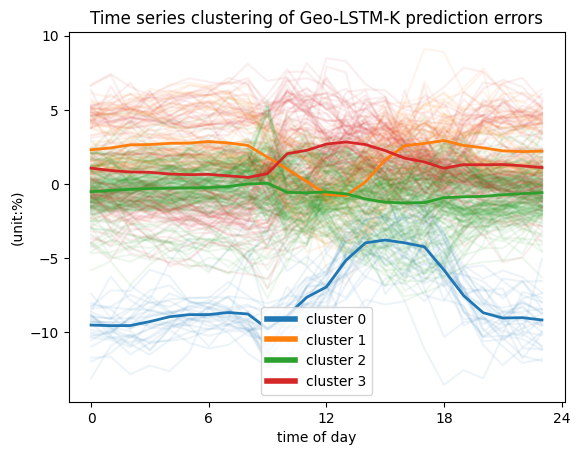

In [384]:
tmparray=np.array(puredata['RH0719_lstmrk_'])[:,8:-16].reshape(-1,24)
colors=sns.color_palette()
fig,ax=plt.subplots()
for i in range(tmparray.shape[0]):
    sns.lineplot(tmparray[i,:],color=colors[kmeans.labels_[i]],alpha=0.08,ax=ax)
for j in range(nclu):
    sns.lineplot(tmparray[kmeans.labels_==j,:].mean(axis=0),color=colors[j],linewidth=2,ax=ax)
ax.set_xticks([0,6,12,18,24])
ax.set_xlabel('time of day')
ax.set_ylabel('(unit:%)')
ax.set_title('Time series clustering of Geo-LSTM-K prediction errors')
ax.legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])

Text(0.5, 0, 'Hour in the day')

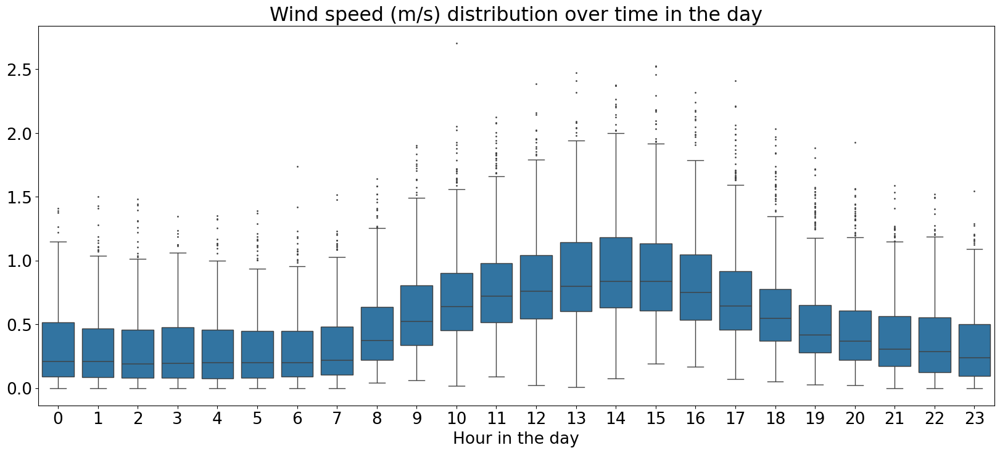

In [703]:
tmparray=np.mean(np.array(windspeeddf.drop(columns=['Date','Time']).loc[0:43199,:]).reshape(-1,60,14),axis=1).transpose().reshape(-1,24)#windspeeddf
fig,ax=plt.subplots(figsize=(20, 8))
sns.boxplot(tmparray, ax=ax,fliersize=1,color=colorpal[0]) 

ax.set_title("Wind speed (m/s) distribution over time in the day") 
#ax.set_title("Solar radiation (W/m²) distribution over time in the day") 
#if ax != axes[-1]: 
#    ax.set_xlabel('')
#else:
ax.set_xlabel("Hour in the day")

Text(0.5, 0, 'Hour in the day')

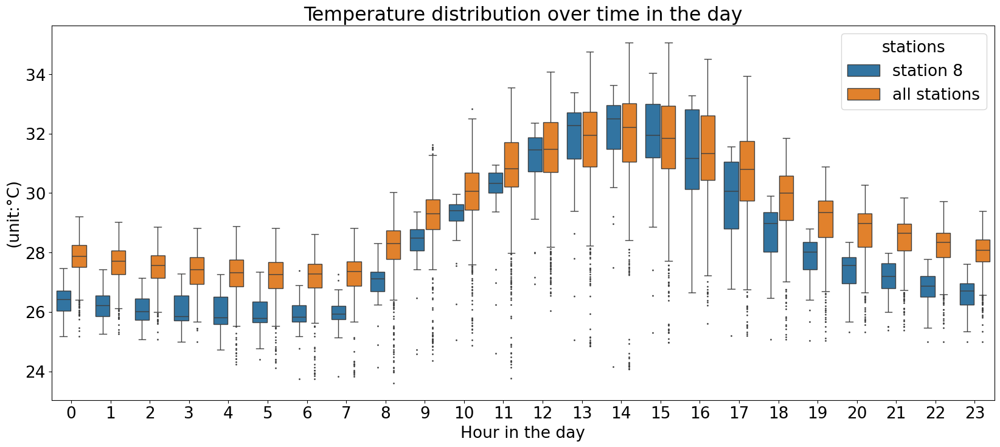

In [560]:
measure='Tem0719'
df = pd.read_csv(dir + measure +'.csv')
tmparray=np.mean(np.array(df.drop(columns=['Date','Time']).loc[0:43199,'Temperature_12']).reshape(-1,60,1),axis=1).transpose().reshape(-1,24)
tmparray2=np.mean(np.array(df.drop(columns=['Date','Time']).loc[0:43199,:]).reshape(-1,60,14),axis=1).transpose().reshape(-1,24)
tmplist=['station 8','all stations']
colorpal=sns.color_palette("tab10")
fig, axes = plt.subplots(1, 1, figsize=(20, 8), sharex=True)
ax=axes
plottempdf=None
for i, ay in enumerate([tmparray,tmparray2]):
    tempdf=pd.DataFrame(data=ay.reshape(-1,1))
    tempdf['stations']=tmplist[i]
    tempdf['time']=list(range(24))*ay.shape[0]
    if plottempdf is None:
        plottempdf=tempdf.copy()
    else:
        plottempdf=pd.concat([plottempdf,tempdf])
#for clusterid,ax in enumerate(axes):
sns.boxplot(gap=0.1,x='time',y=0,hue='stations',data = plottempdf, ax=ax,fliersize=1) 
#sns.boxplot(tmparray, ax=ax,fliersize=1,color=colorpal[0]) 
#sns.boxplot(gap=0.1,x='time',y=0,vue='method',color=colorpal,data = np.array(puredata[measure+method]).reshape(-1,24), ax=ax) 
#sns.boxplot(data = puredata_[plotdf['cluster']==clusterid].to_numpy().reshape(-1,24), ax=ax) 
#ax.set_ylim([-25,20])
ax.set_ylabel("(unit:{})".format(measureunit[measure])) 
ax.set_title("{} distribution over time in the day".format(measurenames[measure])) 
#if ax != axes[-1]: 
#    ax.set_xlabel('')
#else:
ax.set_xlabel("Hour in the day")


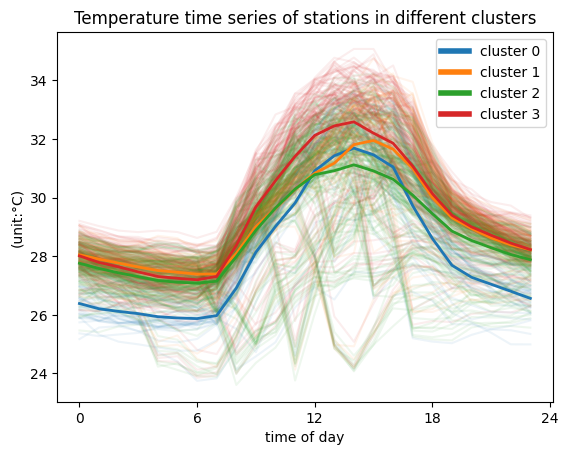

In [335]:
measure='Tem0719'
df = pd.read_csv(dir + measure +'.csv')
tmparray=np.mean(np.array(df.drop(columns=['Date','Time']).loc[1440:43199,:]).reshape(-1,60,14),axis=1).transpose().reshape(-1,24)
colors=sns.color_palette()
fig,ax=plt.subplots()
for i in range(tmparray.shape[0]):
    sns.lineplot(tmparray[i,:],color=colors[kmeans.labels_[i]],alpha=0.08)
for j in range(nclu):
    sns.lineplot(tmparray[kmeans.labels_==j,:].mean(axis=0),color=colors[j],linewidth=2)
ax.set_xticks([0,6,12,18,24])
ax.set_xlabel('time of day')
ax.set_ylabel('(unit:{})'.format(measureunit[measure]))
ax.set_title('{} time series of stations in different clusters'.format(measurenames[measure]))
ax.legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])


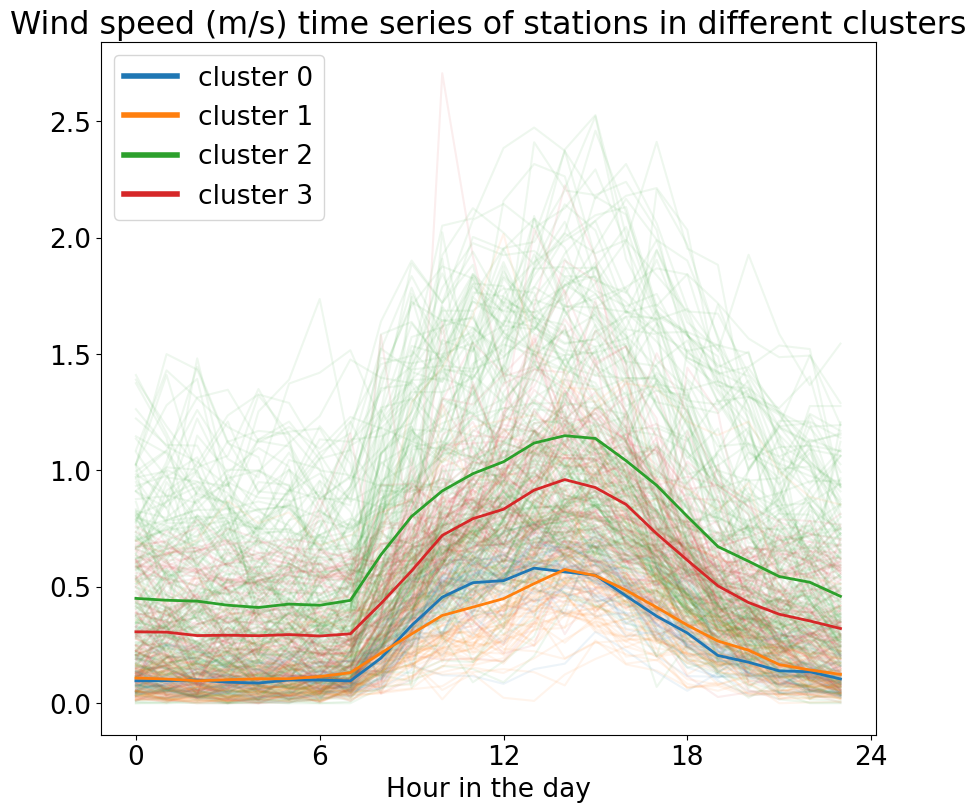

In [699]:
tmparray=np.mean(np.array(windspeeddf.drop(columns=['Date','Time']).loc[1440:43199,:]).reshape(-1,60,14),axis=1).transpose().reshape(-1,24)
colors=sns.color_palette()
fig,ax=plt.subplots(figsize=(10,9))
for i in range(tmparray.shape[0]):
    sns.lineplot(tmparray[i,:],color=colors[kmeans.labels_[i]],alpha=0.08)
for j in range(nclu):
    sns.lineplot(tmparray[kmeans.labels_==j,:].mean(axis=0),color=colors[j],linewidth=2)
ax.set_xticks([0,6,12,18,24])
ax.set_xlabel('Hour in the day')
#ax.set_ylabel('(unit:')
ax.set_title('Wind speed (m/s) time series of stations in different clusters')
ax.legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])


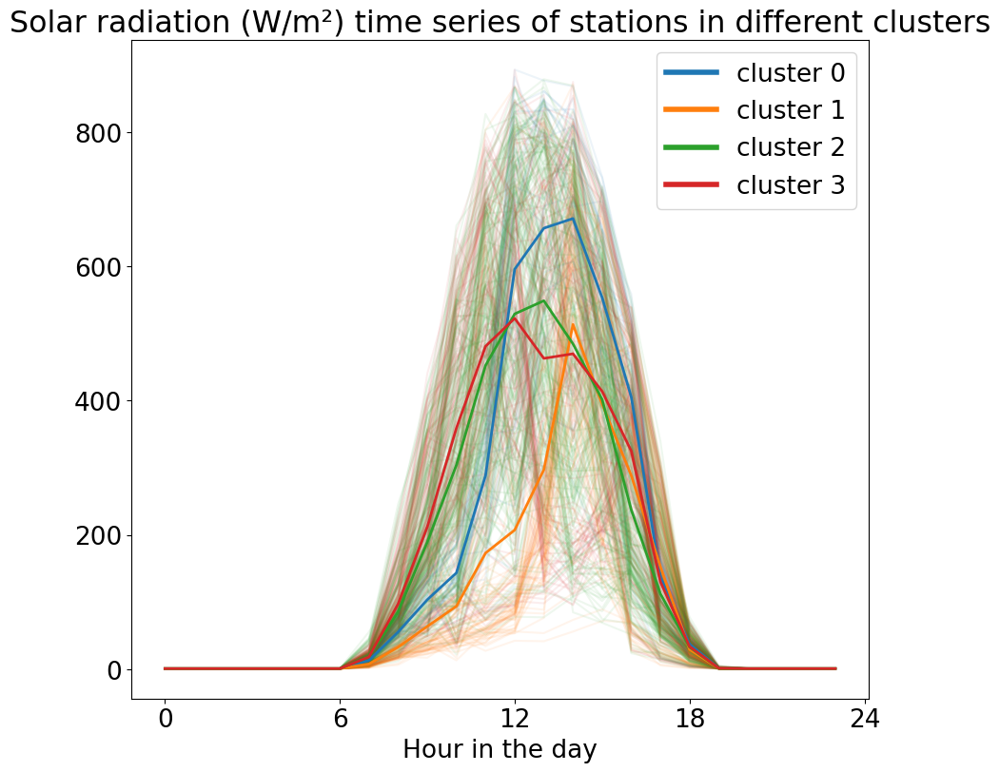

In [698]:
tmparray=np.mean(np.array(solardf.drop(columns=['Date','Time']).loc[1440:43199,:]).reshape(-1,60,14),axis=1).transpose().reshape(-1,24)
colors=sns.color_palette()
fig,ax=plt.subplots(figsize=(10,9))
for i in range(tmparray.shape[0]):
    sns.lineplot(tmparray[i,:],color=colors[kmeans.labels_[i]],alpha=0.08)
for j in range(nclu):
    sns.lineplot(tmparray[kmeans.labels_==j,:].mean(axis=0),color=colors[j],linewidth=2)
ax.set_xticks([0,6,12,18,24])
ax.set_xlabel('Hour in the day')
#ax.set_ylabel('(unit:')
ax.set_title('Solar radiation (W/m²) time series of stations in different clusters')
ax.legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])


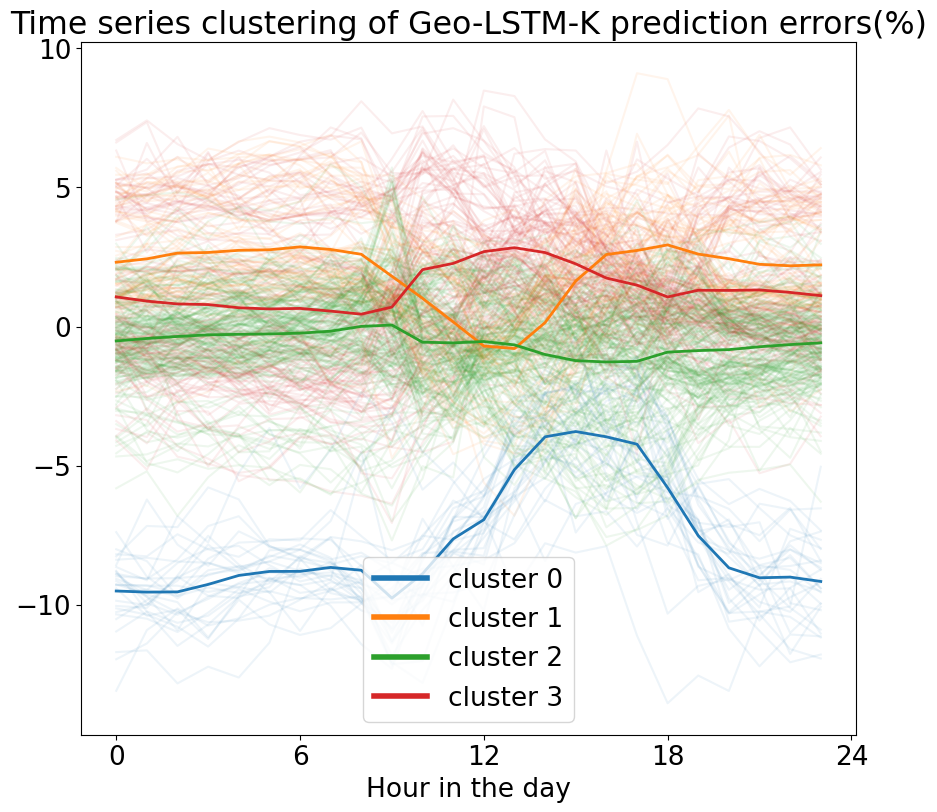

In [701]:
colors=sns.color_palette()
fig,ax=plt.subplots(figsize=(10,9))
measure='RH0719'
errormatrix=np.array(puredata[measure+'_lstmrk_'])
errormatrix=errormatrix[:,8:-16]
tmperror=errormatrix.reshape(-1,24)
for i in range(tmperror.shape[0]):
    sns.lineplot(tmperror[i,:],color=colors[kmeans.labels_[i]],alpha=0.08)
for j in range(nclu):
    sns.lineplot(tmperror[kmeans.labels_==j,:].mean(axis=0),color=colors[j],linewidth=2)
ax.set_xticks([0,6,12,18,24])
ax.set_xlabel('Hour in the day')
#ax.set_ylabel('(unit:°C)')
ax.set_title('Time series clustering of Geo-LSTM-K prediction errors({})'.format(measureunit[measure]))
ax.legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])

In [498]:
wsdf.keys()

Index(['X', 'Y', 'ID', 'distToBuilding', 'percentbuilt', 'terrain', 'Area',
       'Temparea', 'Valley', 'distToTree', 'distToWalkway', 'distToRoad',
       'distToPath', 'distToCourtTrack', 'distToCarpark', 'percentroad',
       'percentpath', 'percentwalkway', 'percentcourttrack', 'percentcarpark',
       'numtrees', 'Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'cluster'],
      dtype='object')

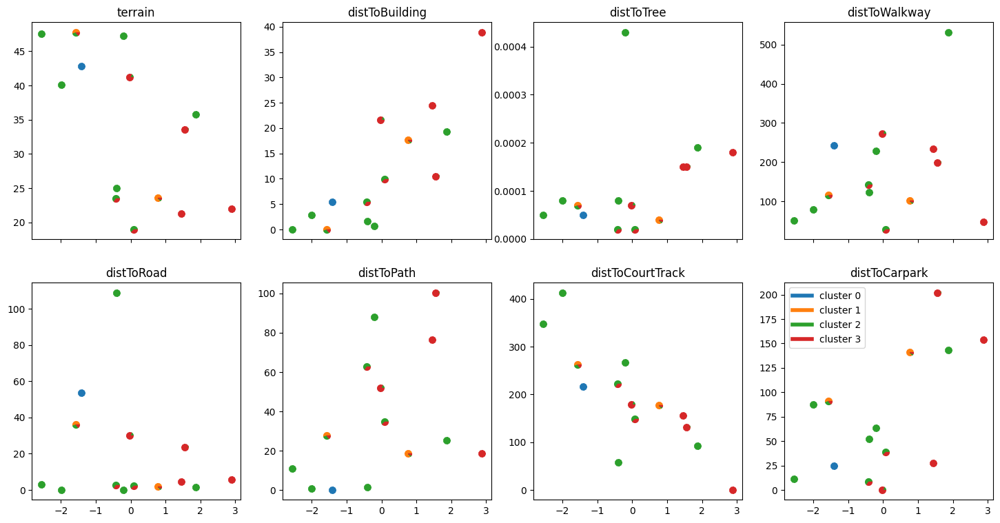

In [719]:
def drawPieMarker(xs, ys, ratios, sizes, colors,ax):
    assert sum(ratios) <= 1, 'sum of ratios needs to be < 1'

    markers = []
    previous = 0
    # calculate the points of the pie pieces
    for color, ratio in zip(colors, ratios):
        this = 2 * np.pi * ratio + previous
        x  = [0] + np.cos(np.linspace(previous, this, 10)).tolist() + [0]
        y  = [0] + np.sin(np.linspace(previous, this, 10)).tolist() + [0]
        xy = np.column_stack([x, y])
        previous = this
        if ratio==0:
            continue
        else:
            markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color})

    # scatter each of the pie pieces to create pies
    for marker in markers:
        ax.scatter(xs, ys, **marker)

plt.rcParams.update({'font.size': 10})  
fig, axs = plt.subplots(2, 4, figsize = (18, 9),sharex=True,sharey=False)

colors=sns.color_palette()
for j in range(8):
    for i in range(14):
        drawPieMarker(#xs=PCA(n_components=1).fit_transform(errormatrix)[i],
                    xs=PCA(n_components=1).fit_transform((wsdf[features]-wsdf[features].mean())/wsdf[features].std())[i],
                    ys=wsdf.loc[i,features[j]],
                    #ratios=clusterresult[i,:],
                    ratios=lulcclusterresult[i,:],
                    sizes=[50],
                    colors=colors[0:4],
                    ax=axs[int(np.floor(j/4))][int(np.mod(j,4))])
    axs[int(np.floor(j/4))][int(np.mod(j,4))].set_title(features[j])
    #axs[int(np.floor(j/4))][int(np.mod(j,4))].set_xticks([1],[''])
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=color, lw=4) for color in colors]
axs[-1][-1].legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])
plt.show()
plt.rcParams.update({'font.size': 19})
#for i in range(8):
#    for l in range(tmperror.shape[0]):
#        axs[i].scatter(1,wsdf.loc[np.floor(l/30),features[i]],color=colors[kmeans.labels_[l]],alpha=0.05)
#for j in range(nclu):
#    sns.lineplot(tmperror[kmeans.labels_==j,:].mean(axis=0),color=colors[j],linewidth=2)

In [723]:
clusterresultarray=np.zeros((14,nclu),bool)
for j in range(14):
    for i in range(nclu):
        clusterresultarray[j,i]=wsdf['cluster'][j][i]>0
for i in range(nclu):
    for feature in ['distToBuilding','terrain','distToWalkway']:
        tmpmean=(np.array(wsdf[[feature]])*lulcclusterresult).sum(axis=0)/lulcclusterresult.sum(axis=0) 
        print('{}_clu{}mean:{}'.format(feature,i,(wsdf[feature]*lulcclusterresult[:,i]).sum()/lulcclusterresult[:,i].sum()))

        #print( '{}_clu{}std:{}'.format(feature,i,(((wsdf[feature]-tmpmean[i])**2*lulcclusterresult[:,i]).sum()/(lulcclusterresult[:,i].sum()))**0.5 ) )


distToBuilding_clu0mean:9.08183061188805
terrain_clu0mean:35.101035020897875
distToWalkway_clu0mean:173.96297550136504
distToBuilding_clu1mean:9.703388067480848
terrain_clu1mean:30.90648167687913
distToWalkway_clu1mean:130.48276794314546
distToBuilding_clu2mean:5.944559821797387
terrain_clu2mean:38.24882131417144
distToWalkway_clu2mean:194.34058395672602
distToBuilding_clu3mean:23.087742295975367
terrain_clu3mean:25.372507082220384
distToWalkway_clu3mean:145.03082635034872


In [606]:
wsdf['terrain'][lulcclusterresult[:,1]>0]

4     18.97783
5     47.79486
7     33.60504
9     41.24351
10    23.54144
13    23.56321
Name: terrain, dtype: float64

In [716]:
lulcclusterresult[[4,5,7,9,10,13],:]=clusterresult[[4,2,12,3,13,10],:]
lulcclusterresult

array([[0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [1.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.03448276, 0.5862069 , 0.37931034],
       [0.        , 0.55172414, 0.31034483, 0.13793103],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.03448276, 0.03448276, 0.93103448],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 0.17241379, 0.82758621],
       [0.        , 0.03448276, 0.62068966, 0.34482759],
       [0.        , 0.        , 0.        , 1.        ],
       [0.        , 0.        , 0.        , 1.        ],
       [0.        , 0.86206897, 0.06896552, 0.06896552]])

In [713]:
clusterresult

array([[0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.89655172, 0.        , 0.10344828],
       [0.        , 0.55172414, 0.31034483, 0.13793103],
       [0.        , 0.        , 0.17241379, 0.82758621],
       [0.        , 0.03448276, 0.5862069 , 0.37931034],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.03448276, 0.96551724, 0.        ],
       [1.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 1.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.86206897, 0.06896552, 0.06896552],
       [0.        , 0.03448276, 0.96551724, 0.        ],
       [0.        , 0.03448276, 0.03448276, 0.93103448],
       [0.        , 0.03448276, 0.62068966, 0.34482759]])

In [481]:
lulckmeans=KMeans(n_clusters=4, random_state=0, n_init="auto").fit((wsdf[features]-wsdf[features].mean())/wsdf[features].std())

In [720]:
lulcclusterresult=lulckmeans.transform((wsdf[features]-wsdf[features].mean())/wsdf[features].std())

In [721]:
lulcclusterresult[[0,1,3,6,8],:]=0
lulcclusterresult[[0,1,3,6,8],2]=1
lulcclusterresult[2,:]=0
lulcclusterresult[2,0]=1
lulcclusterresult[[11,12],:]=0
lulcclusterresult[[11,12],3]=1
lulcclusterresult=lulcclusterresult/np.sum(lulcclusterresult,axis=1,keepdims=True)

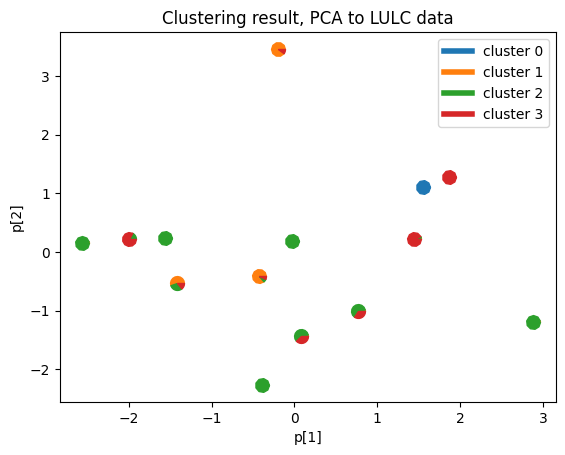

In [455]:
import numpy as np
import matplotlib.pyplot as plt

def drawPieMarker(xs, ys, ratios, sizes, colors):
    assert sum(ratios) <= 1, 'sum of ratios needs to be < 1'

    markers = []
    previous = 0
    # calculate the points of the pie pieces
    for color, ratio in zip(colors, ratios):
        this = 2 * np.pi * ratio + previous
        x  = [0] + np.cos(np.linspace(previous, this, 10)).tolist() + [0]
        y  = [0] + np.sin(np.linspace(previous, this, 10)).tolist() + [0]
        xy = np.column_stack([x, y])
        previous = this
        if ratio != 0:
            markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color})

    # scatter each of the pie pieces to create pies
    for marker in markers:
        ax.scatter(xs, ys, **marker)


fig, ax = plt.subplots()
for i in range(14):
    drawPieMarker(xs=pcaxy[i,0],#xs=wsdf.loc[i,'X'],
                ys=pcaxy[i,1],#ys=wsdf.loc[i,'Y'],
                ratios=clusterresult[i,:],
                sizes=[100],
                colors=colors[0:4])
ax.legend(custom_lines, ['cluster 0', 'cluster 1', 'cluster 2','cluster 3'])
ax.set_xlabel('p[1]')
ax.set_ylabel('p[2]')
plt.title('Clustering result, PCA to LULC data')
plt.show()

In [13]:
methods=['_lstmrk_','_lstmok_','_grurk_','_gruok_','_ne_','_iwec_','_changi_']#'
puredata={}
for method in methods:
    puredata[measure+method]=plotdf.iloc[:,embedding_length:embedding_length+len(data)*batchsize].to_numpy()

NameError: name 'data' is not defined

In [726]:
#heatmap
## Select features for model, excluded most of the percent** because they seem quite small and not significant, especially for features with small area like walkways
#for i, mth in enumerate(range(len(data))):
#    truevalue = hourdata[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length,:]
#    puredata[measure+'_iwec_'][:,mth*batchsize:(mth+1)*batchsize] = (amydata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()
#    puredata[measure+'_changi_'][:,mth*batchsize:(mth+1)*batchsize] = (changidata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()

features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
p = wsdf[features].drop(targetstationid)
target_p = griddf[features]
target_x = np.array(list(zip(griddf.X, griddf.Y)))

feature_importance_df = pd.DataFrame(features, columns =['FeatureName'])

### SVR model parameters
C = 0.0005
gamma = 5
kernel = ['linear'] # options: ['linear', 'poly', 'rbf', 'sigmoid']

### RandomForestRegressor parameters
n_estimators=50
random_state=4

### RegressionKrigging parameters
n = 8
variogram_models = ['spherical'] # options: ["linear", "power", "gaussian", "spherical", "exponential"]

#months = ["Feb-19","Mar-19","Apr-19","May-19","Jun-19","Jul-19","Aug-19","Sep-19","Oct-19","Nov-19","Dec-19","Jan-20","Feb-20","Mar-20","Apr-20"]
months = [5,12,31]
#months = [21]
batchindex = 5
### Load base geojson grid to export geojson file
basejson = []
# with open(dir + 'GeoJSON/BaseGrid.geojson', 'r') as file:
#     basejson = json.load(file)

data=[]
testdata=[]
allstations=np.array(range(14))
targetstationid=7
otherstationsid=np.delete(allstations,targetstationid).tolist()
with open('trainednw\\{}lstmmodel_target{}.pkl'.format(measure,targetstationid), 'rb') as f:
        mymodel = pickle.load(f)
if batchsize ==1:
    for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
        data.append(Mydata(torch.tensor((np.delete(hourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(hourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
    for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
        testdata.append(Mydata(torch.tensor((np.delete(testhourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(testhourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

else:
    for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
        data.append(Mydata(torch.tensor(np.array([(np.delete(hourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                    ,torch.tensor((np.delete(hourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
    for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
        testdata.append(Mydata(torch.tensor(np.array([(np.delete(testhourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                    ,torch.tensor((np.delete(testhourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))


for k in variogram_models:
    print(k)
    # model = SVR(C=C, gamma=gamma, kernel=k)
    model = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state)
    # model = LinearRegression(copy_X=True, fit_intercept=False)

    scores_mths = []
    #train_model(mymodel, data, epoch=1000)
     #   continue
    griddflist=[]
    for i, mth in enumerate(months):
        griddflist.append(griddf.copy())
        print("Date : {}, Time : {}".format(df.iloc[(mth*batchsize+batchindex+embedding_length)*60,0],df.iloc[(mth*batchsize+batchindex+embedding_length)*60,1]))

        x = np.array(list(zip(wsdf.drop(targetstationid).X, wsdf.drop(targetstationid).Y)))
        truevalue = hourdata[mth*batchsize+batchindex+embedding_length,:]
        lastdayvalue = hourdata[mth*batchsize+batchindex+embedding_length-24,:]
        target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
        # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
        #     p, x, target, test_size=0.3, random_state=42
        # )
        plotdf['plotdata'+str()]=truevalue
        print("=" * 40)
        m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
        m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)

        # m_rk.fit(p_train, x_train,target_train)
        # score = m_rk.score(p_test, x_test,target_test)
        # scores_mths.append(score)

        m_rk.fit(p, x, target)
        result = m_rk.predict(target_p, target_x)
        griddflist[i][measure+'_lstmrk_'] = result
        #z,sigma=m_ok.execute('points',griddf['X'],griddf['Y'])
        #griddflist[i][measure+'_ok_'] = z
        
        #for i in range(len(griddf)):
        #    griddf.loc[i,measure+'_ne_']= lastdayvalue[otherstationsid[np.argmin((wsdf.loc[otherstationsid,'X']-griddf.loc[i,'X'])**2+(wsdf.loc[otherstationsid,'Y']-griddf.loc[i,'Y'])**2)]]
    
    fig, axes = plt.subplots(3, 1, figsize=(10, 16), sharex=True)
    for timeidx,ax in enumerate(axes):
        hue_norm=(round(min(griddflist[timeidx][measure+'_lstmrk_']),1),round(max(griddflist[timeidx][measure+'_lstmrk_']),1))
        g = sns.scatterplot(x="X", y="Y",
                        hue=measure+'_lstmrk_',
                        palette="Spectral_r",
                        data=griddflist[timeidx],
                        hue_norm=hue_norm,
                        edgecolor="none",
                        ax=ax)
        sns.scatterplot(x="X", y="Y",
                        hue='plotdata'+[timeidx],
                        palette="Spectral_r",
                        data=plotdf.iloc[otherstationsid],
                        hue_norm=hue_norm,
                        edgecolor="black",
                        legend=None,
                        ax=ax)
        sns.scatterplot(x="X", y="Y",
                        hue='plotdata',
                        palette="Spectral_r",
                        data=plotdf.iloc[[targetstationid]],
                        hue_norm=hue_norm,
                        edgecolor="white",
                        legend=None,
                        ax=ax)
        ax.set_title("Temperature prediction samples, Date : {}, Time : {}".format(df.iloc[(mth*batchsize+batchindex+embedding_length)*60,0],df.iloc[(mth*batchsize+batchindex+embedding_length)*60,1]))
        
        # plt.savefig(dir + 'Export/' + measure + mth + '.png', bbox_inches='tight')
        plt.show()
        griddflist[timeidx].to_csv(dir + 'Export/' + measure + str(mth) + '.csv')
        
    ### Only for RandomForestRegressor, to extract feature importances
    feature_importance_df[mth] = m_rk.regression_model.feature_importances_
    featuredf = pd.DataFrame(list(zip(m_rk.regression_model.feature_names_in_, m_rk.regression_model.feature_importances_)), columns =['FeatureName', 'FeatureImportance'])
    display(featuredf.sort_values(by=['FeatureImportance'], ascending=False))

        ### Add properties to geojson and export
        # Tmaxes = resultdf['Tmax'].tolist()
        # for i in range(len(resultdf.index)):
        #     basejson['features'][i]['properties']['Tmax'] = Tmaxes[i]
        # with open(dir + 'Export/' + measure + mth + '.geojson', 'w') as outfile:
        #     json.dump(basejson, outfile)

    # avg = sum(scores_mths) / len(scores_mths)
    # scores_all.append([k,C,gamma,n] + scores_mths + [avg] )

spherical
Date : 05/07/19, Time : 04:00:00
Finished learning regression model
Finished kriging residuals


KeyboardInterrupt: 

In [732]:
len(griddflist)

1

In [739]:
mymodel(data[mth].x)[batchindex,:]

tensor([1.0666, 0.4521, 0.4555, 0.9358, 1.2559, 0.7335, 0.6601, 0.5317, 0.4476,
        0.3415, 1.0598, 1.0030, 0.7856], grad_fn=<SliceBackward0>)

In [762]:
measure='Tem0719'
npdata=np.array(pd.read_csv(dir + measure +'.csv').iloc[:,2:16])
hourdata=np.sum(npdata.reshape([-1,60,14]),axis=1)/60
testhourdata=np.sum(np.array(testdf.iloc[:,2:16]).reshape([-1,60,14]),axis=1)/60
mean = hourdata.mean()
std = hourdata.std()

data=[]
testdata=[]
allstations=np.array(range(14))
targetstationid=7
otherstationsid=np.delete(allstations,targetstationid).tolist()
with open('trainednw\\{}lstmmodel_target{}.pkl'.format(measure,targetstationid), 'rb') as f:
        mymodel = pickle.load(f)
if batchsize ==1:
    for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
        data.append(Mydata(torch.tensor((np.delete(hourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(hourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
    for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
        testdata.append(Mydata(torch.tensor((np.delete(testhourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(testhourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

else:
    for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
        data.append(Mydata(torch.tensor(np.array([(np.delete(hourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                    ,torch.tensor((np.delete(hourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
    for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
        testdata.append(Mydata(torch.tensor(np.array([(np.delete(testhourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                    ,torch.tensor((np.delete(testhourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

#griddflist=[]
#plotdflist=[]
for i, mth in enumerate(months):
    #griddflist.append(griddf.copy())
    #plotdflist.append(plotdf.copy())
    print("Date : {}, Time : {}".format(df.iloc[(mth*batchsize+batchindex+embedding_length)*60,0],df.iloc[(mth*batchsize+batchindex+embedding_length)*60,1]))

    x = np.array(list(zip(wsdf.drop(targetstationid).X, wsdf.drop(targetstationid).Y)))
    truevalue = hourdata[mth*batchsize+batchindex+embedding_length,:]
    lastdayvalue = hourdata[mth*batchsize+batchindex+embedding_length-24,:]
    target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
    # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
    #     p, x, target, test_size=0.3, random_state=42
    # )
    plotdf['plotdata']=truevalue
    print("=" * 40)
    m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
    m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)

    # m_rk.fit(p_train, x_train,target_train)
    # score = m_rk.score(p_test, x_test,target_test)
    # scores_mths.append(score)

    m_rk.fit(p, x, target)
    result = m_rk.predict(target_p, target_x)
    griddflist[i][measure+'_lstmrk_'] = result

Date : 05/07/19, Time : 04:00:00
Finished learning regression model
Finished kriging residuals
Date : 09/07/19, Time : 20:00:00
Finished learning regression model
Finished kriging residuals
Date : 22/07/19, Time : 12:00:00
Finished learning regression model
Finished kriging residuals


In [737]:
pdhourdata.iloc[otherstationsid,months[timeidx]*batchsize+batchindex+embedding_length]
len(griddflist)

3

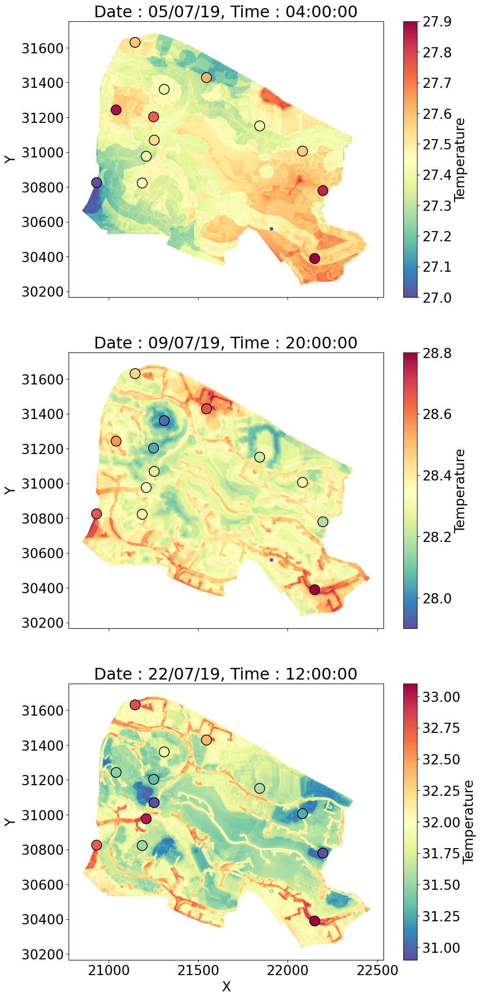

In [763]:
fig, axes = plt.subplots(3, 1, figsize=(10, 24), sharex=True)
import matplotlib as mpl
#cmap=sns.cubehelix_palette(as_cmap=True)
pdhourdata=pd.DataFrame(hourdata).transpose()
pdhourdata['X']=list(wsdf['X'])
pdhourdata['Y']=list(wsdf['Y'])
for timeidx,ax in enumerate(axes):
    hue_norm=(round(min(griddflist[timeidx][measure+'_lstmrk_']),1),round(max(griddflist[timeidx][measure+'_lstmrk_']),1))
    g = sns.scatterplot(x="X", y="Y",s=2,
                    hue=measure+'_lstmrk_',
                    palette=sns.color_palette("Spectral_r",as_cmap=True),
                    data=griddflist[timeidx],
                    hue_norm=hue_norm,
                    edgecolor="none",
                    legend=None,
                    ax=ax)
    cmap = sns.color_palette("Spectral_r",as_cmap=True)
    norm = mpl.colors.Normalize(vmin=hue_norm[0], vmax=hue_norm[1])

    fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             ax=ax, orientation='vertical', label=measurenames[measure])
    #fig.colorbar(sns.mappable(sns.color_palette("Spectral_r",as_cmap=True)),ax=g)
    sns.scatterplot(x="X", y="Y",  s=200,
                    hue=(months[timeidx]*batchsize+batchindex+embedding_length),
                    palette=sns.color_palette("Spectral_r",as_cmap=True),
                    data=pdhourdata.iloc[otherstationsid],
                    hue_norm=hue_norm,
                    edgecolor="black",
                    legend=None,
                    ax=ax)
    sns.scatterplot(x="X", y="Y", s=20,
                    hue=(months[timeidx]*batchsize+batchindex+embedding_length),
                    palette=sns.color_palette("Spectral_r",as_cmap=True),
                    data=pdhourdata.iloc[[targetstationid]],
                    hue_norm=hue_norm,
                    edgecolor="blue",
                    legend=None,
                    ax=ax)
    ax.set_title("Date : {}, Time : {}".format(df.iloc[(months[timeidx]*batchsize+batchindex+embedding_length)*60,0],df.iloc[(months[timeidx]*batchsize+batchindex+embedding_length)*60,1]))
    
    # plt.savefig(dir + 'Export/' + measure + mth + '.png', bbox_inches='tight')
plt.show()

In [71]:
wsdf['cluster']

0                                    [0.0, 0.0, 1.0]
1     [0.0, 0.23333333333333334, 0.7666666666666667]
2      [0.0, 0.3333333333333333, 0.6666666666666666]
3     [0.0, 0.8333333333333334, 0.16666666666666666]
4      [0.0, 0.5333333333333333, 0.4666666666666667]
5     [0.0, 0.03333333333333333, 0.9666666666666667]
6                                    [0.0, 0.0, 1.0]
7                                    [1.0, 0.0, 0.0]
8                                    [0.0, 1.0, 0.0]
9                                    [0.0, 0.0, 1.0]
10     [0.0, 0.3333333333333333, 0.6666666666666666]
11                                   [0.0, 0.0, 1.0]
12                                   [0.0, 1.0, 0.0]
13    [0.0, 0.43333333333333335, 0.5666666666666667]
Name: cluster, dtype: object

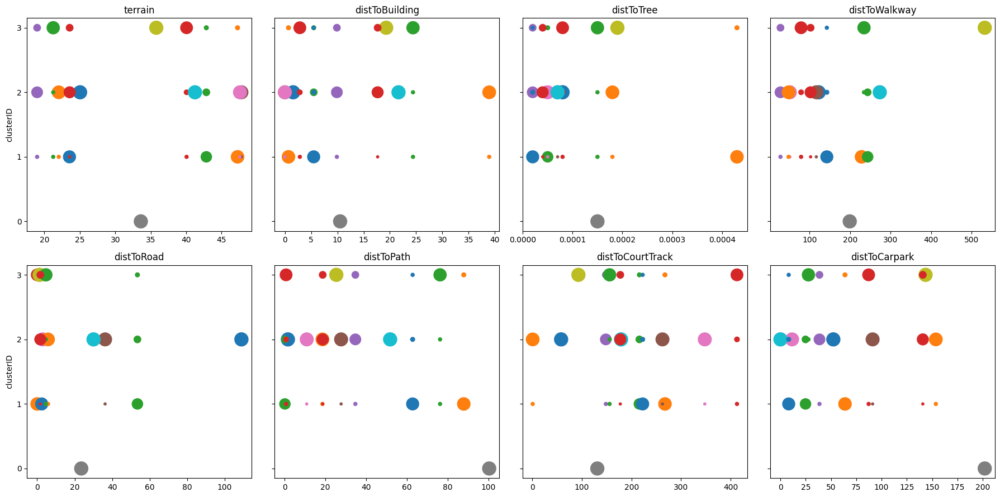

In [80]:
fig, axs = plt.subplots(2, 4, figsize = (18, 9),sharey=True)

for i in range(2):
    for j in range(4):
        k = i * 4 + j
        if k >= len(features):
            break
        for l in range(14):
            axs[i][j].scatter([wsdf.loc[l,features[k]]]*nclu,range(nclu), s=300*wsdf.loc[l,'cluster'])
        axs[i][j].set_title(features[k])
        axs[i][j].set_yticks(range(nclu))
    axs[i][0].set_ylabel('clusterID')

fig.tight_layout()
plt.show()

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(10, 16), sharex=True)
#for i, (method,ax) in enumerate(zip(methods,axes)):
for clusterid,ax in enumerate(axes):
    #sns.boxplot(data = puredata[method].reshape(-1,24), ax=ax) 
    sns.boxplot(data = puredata[measure+'_lstmrk_'][plotdf['cluster']==clusterid].reshape(-1,24), ax=ax) 
    ax.set_ylim([-10,10])
    ax.set_ylabel("(unit:%)") 
    ax.set_title("RH prediction error of stations in cluster {} by LSTM-RK method".format(clusterid)) 
    if ax != axes[-1]: 
        ax.set_xlabel('')
    else:
        ax.set_xlabel("time in the day")

In [766]:
wsdf['terrain']

0     25.03599
1     47.24897
2     42.84434
3     40.05906
4     18.97783
5     47.79486
6     47.58942
7     33.60504
8     35.78543
9     41.24351
10    23.54144
11    22.02973
12    21.24668
13    23.56321
Name: terrain, dtype: float64

C:\Users\59558\AppData\Local\Temp\ipykernel_51448\3999793477.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plotdf['cluster'].iloc[7]=2
C:\Users\59558\AppData\Local\Temp\ipykernel_51448\3999793477.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plotdf['cluster'].iloc[8]=2


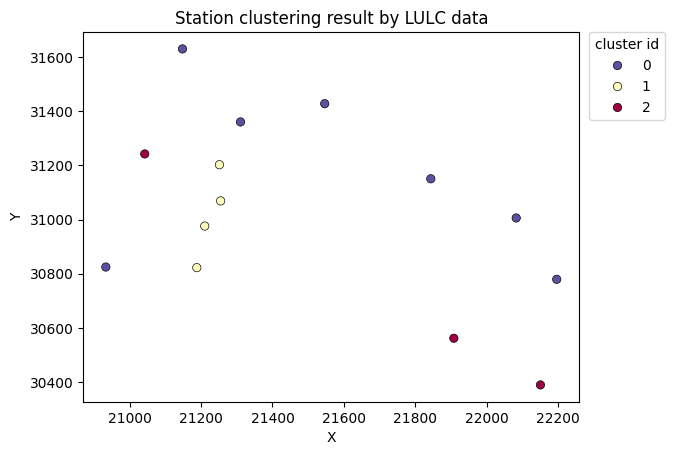

In [514]:
from dtw import dtw

# Here, we use L2 norm as the element comparison distance
l2_norm = lambda x, y: (x - y) ** 2
dist=np.zeros((13,13))
pathlist=[]
acc_cost_matrixlist=[]

sample=42
sampledata=mymodel(testdata[sample].x)-testdata[sample].y

for i in range(13):
    for j in range(13):
        #dist[i,j], cost_matrix, acc_cost_matrix, path = dtw(hourdata[0:168,i].reshape(-1,1),hourdata[0:168,j].reshape(-1,1), dist=l2_norm)
        dist[i,j], cost_matrix, acc_cost_matrix, path = dtw(sampledata[:,i].reshape(-1,1),sampledata[:,j].reshape(-1,1), dist=l2_norm)
        pathlist.append(path)
        acc_cost_matrixlist.append(acc_cost_matrix)

from sklearn.cluster import AgglomerativeClustering
clusternum=3
featuredf=(wsdf.loc[:,features]-wsdf.loc[:,features].mean())/wsdf.loc[:,features].std()
clustering = AgglomerativeClustering(n_clusters=clusternum,linkage='ward').fit(featuredf,featuredf)
#clustering = AgglomerativeClustering(n_clusters=clusternum,linkage='ward').fit(dist)
plotdf['cluster']=clustering.labels_
plotdf['cluster'].iloc[7]=2
plotdf['cluster'].iloc[8]=2
g = sns.scatterplot(x="X", y="Y",
                hue='cluster',
                palette="Spectral_r",
                data=plotdf,
                #hue_norm=(78.0,96.0),
                edgecolor="black")
plt.legend(title='cluster id',bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Station clustering result by LULC data')
# plt.savefig(dir + 'Export/' + measure + mth + '.png', bbox_inches='tight')
plt.show()
#dist

In [57]:
plotdf['cluster']

KeyError: 'cluster'

In [516]:
#puredata[plotdf['cluster']==2].to_numpy()
#plotdf.iloc[[targetstationid],embedding_length+mth*batchsize+batchindex]=(result-truevalue)
#plotdf.iloc[targetstationid,embedding_length+mth*batchsize+batchindex]
#wsdf[plotdf['cluster']==0].loc[:,features]
wsdf['cluster']=plotdf['cluster'].to_list()
wsdf[wsdf['cluster']==0].loc[:,features]

,terrain,distToBuilding,distToTree,distToWalkway,distToRoad,distToPath,distToCourtTrack,distToCarpark
0,25.03599,1.57015,0.00008,122.30539,108.95792,1.60972,57.97288,52.28841
4,18.97783,9.90256,0.00002,28.08063,2.45513,34.71876,148.27183,38.57768
9,41.24351,21.65002,0.00007,273.14477,30.09006,51.79948,178.93587,0.00000
10,23.54144,5.48086,0.00002,142.45548,2.46573,62.83724,222.55918,8.15005
11,22.02973,38.93108,0.00018,48.16338,5.79898,18.55649,0.58583,153.68172
12,21.24668,24.41229,0.00015,234.20460,4.65890,76.30626,155.83577,27.67312
13,23.56321,17.67098,0.00004,102.44390,1.71311,18.69014,177.45431,140.79198


In [ ]:
error=[]
for k in variogram_models:
    model = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state)
    for mth in range(len(data)):
        for batchindex in range(batchsize):
            truevalue = hourdata[mth*batchsize+batchindex+embedding_length,targetstationid]
            target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
            m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)
            m_rk.fit(p, x, target)
            result = m_rk.predict(target_p, target_x)
            plotdf.iloc[[targetstationid],embedding_length+mth*batchsize+batchindex]=(result-truevalue)

In [237]:
#not used
for mth in range(len(data)):
    batchy=mymodel(data[mth].x).detach().numpy()*std+mean
    plotdf.iloc[otherstationsid,(embedding_length+mth*batchsize):(embedding_length+(mth+1)*batchsize)]=(hourdata[embedding_length+mth*batchsize:embedding_length+(mth+1)*batchsize,otherstationsid]-batchy).transpose()
puredata=plotdf.iloc[:,embedding_length:embedding_length+len(data)*batchsize]
puredata[plotdf['cluster']==2].to_numpy().reshape(-1,30)

array([[4.938970357259116, 4.33519717407227, 4.052249710083011,
        2.3021801605224574, 1.1945692545572868, 0.6967930704752661,
        0.3424921112060595, -0.08453717041015807, -0.2756210174560536,
        -0.3624928232828779, -0.4844926859537715, -0.5435396982828777,
        -0.5521014506022119, -0.5908866882324126, -0.666458872477218,
        -0.7487072041829421, -0.6769615071614652, -0.2435783487955696,
        0.752541163126633, 1.1986287434895821, 2.07299837239583,
        2.5587537994384704, 3.58027028910319, 4.350652053833009,
        3.037494267781579, 4.3427875010172485, 2.45065277608235,
        2.1440328877766923, 1.2651578928629448, 0.7911657460530499],
       [0.49539991760253344, 0.316899765014643, -0.09585232543945921,
        -0.1334295756022179, -0.1570162251790279, -0.2953322906494087,
        -0.3225261586507102, -0.17893785095214199, -0.26538881429036465,
        -0.49875345865885023, -0.4983966878255224, 0.3052494761149056,
        1.4099835408528563, -1.48133

In [ ]:
#not changed yet
## Select features for model, excluded most of the percent** because they seem quite small and not significant, especially for features with small area like walkways
features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
p = wsdf[features].drop(targetstationid)
target_p = wsdf.loc[targetstationid,features].to_numpy().reshape(1,-1)
target_x = np.array([(wsdf.loc[targetstationid,'X'],wsdf.loc[targetstationid,'Y'])]).reshape(1,-1)

feature_importance_df = pd.DataFrame(features, columns =['FeatureName'])

### SVR model parameters
C = 0.0005
gamma = 5
kernel = ['linear'] # options: ['linear', 'poly', 'rbf', 'sigmoid']

### RandomForestRegressor parameters
n_estimators=50
random_state=4

### RegressionKrigging parameters
n = 8
variogram_models = ['spherical'] # options: ["linear", "power", "gaussian", "spherical", "exponential"]

#months = ["Feb-19","Mar-19","Apr-19","May-19","Jun-19","Jul-19","Aug-19","Sep-19","Oct-19","Nov-19","Dec-19","Jan-20","Feb-20","Mar-20","Apr-20"]
months = [12,31,5]
#months = [21]
batchindex = 5
### Load base geojson grid to export geojson file
basejson = []
# with open(dir + 'GeoJSON/BaseGrid.geojson', 'r') as file:
#     basejson = json.load(file)
dt=[]
for i, mth in enumerate(months):
    dt.append("Date : {}, Time : {}".format(df.iloc[(mth*batchsize+batchindex+embedding_length)*60,0],df.iloc[(mth*batchsize+batchindex+embedding_length)*60,1]))
    plotdf[measure+'_rk_'+dt[i]]=0
    plotdf[measure+'_ok_'+dt[i]]=0
    plotdf[measure+'_ne_'+dt[i]]=0
for targetstationid in range(14):    
    allstations=np.array(range(14))
    otherstationsid=np.delete(allstations,targetstationid).tolist()
    import pickle
    data=[]
    testdata=[]
    if batchsize ==1:
        for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
            data.append(Mydata(torch.tensor((np.delete(hourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(hourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
        for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
            testdata.append(Mydata(torch.tensor((np.delete(testhourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(testhourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

    else:
        for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
            data.append(Mydata(torch.tensor(np.array([(np.delete(hourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                        ,torch.tensor((np.delete(hourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
        for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
            testdata.append(Mydata(torch.tensor(np.array([(np.delete(testhourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                        ,torch.tensor((np.delete(testhourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

    with open('TEMmodel_target{}.pkl'.format(targetstationid), 'rb') as f:
        mymodel = pickle.load(f)
    #mymodel=MyModel(embedding_length=embedding_length,hidden_size=64,output_size=13,batch_size=batchsize)
    train_model(mymodel, data, epoch=1000)
    with open('TEMmodel_target{}.pkl'.format(targetstationid),'wb') as f:
        pickle.dump(mymodel,f)
    #mymodel=clf2
    

    for k in variogram_models:
        # print(k)
        # model = SVR(C=C, gamma=gamma, kernel=k)
        model = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state)
        # model = LinearRegression(copy_X=True, fit_intercept=False)

        scores_mths = []
        #
        #   continue
        
        for i, mth in enumerate(months):
            
            x = np.array(list(zip(wsdf.drop(targetstationid).X, wsdf.drop(targetstationid).Y)))
            truevalue = hourdata[mth*batchsize+batchindex+embedding_length,:]
            target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
            # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
            #     p, x, target, test_size=0.3, random_state=42
            # )
            print("=" * 40)
            m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
            m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)

            # m_rk.fit(p_train, x_train,target_train)
            # score = m_rk.score(p_test, x_test,target_test)
            # scores_mths.append(score)

            m_rk.fit(p, x, target)
            result = m_rk.predict(target_p, target_x)
            plotdf.loc[:,measure+'_rk_'+dt[i]].iloc[[targetstationid]] = result[0]-truevalue[targetstationid]
            z,sigma=m_ok.execute('points',target_x[0,0],target_x[0,1])
            plotdf.loc[:,measure+'_ok_'+dt[i]].iloc[[targetstationid]] = z[0]-truevalue[targetstationid]
            plotdf.loc[:,measure+'_ne_'+dt[i]].iloc[[targetstationid]] = truevalue[otherstationsid[np.argmin((wsdf.loc[otherstationsid,'X']-wsdf.loc[targetstationid,'X'])**2+(wsdf.loc[otherstationsid,'Y']-wsdf.loc[targetstationid,'Y'])**2)]]-truevalue[targetstationid]
            
for i, mth in enumerate(months):
    print(dt[i])        
    for method in methods:
        g = sns.scatterplot(x="X", y="Y",
                        hue=measure+method+dt[i],
                        palette="Spectral_r",
                        data=plotdf.iloc[otherstationsid,:],
                        #hue_norm=(-1,1),
                        edgecolor="black")
        plt.title("Temperature prediction error samples, Date : {}, Time : {}".format(df.iloc[(mth*batchsize+batchindex+embedding_length)*60,0],df.iloc[(mth*batchsize+batchindex+embedding_length)*60,1]))
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
        plt.show()
        # plt.savefig(dir + 'Export/' + measure + mth + '.png', bbox_inches='tight')
        #resultdf.to_csv(dir + 'Export/' + measure + mth + '.csv')
    error=result-truevalue
    display(error)

        ### Add properties to geojson and export
        # Tmaxes = resultdf['Tmax'].tolist()
        # for i in range(len(resultdf.index)):
        #     basejson['features'][i]['properties']['Tmax'] = Tmaxes[i]
        # with open(dir + 'Export/' + measure + mth + '.geojson', 'w') as outfile:
        #     json.dump(basejson, outfile)

    # avg = sum(scores_mths) / len(scores_mths)
    # scores_all.append([k,C,gamma,n] + scores_mths + [avg] )


fig, axes = plt.subplots(clusternum, 1, figsize=(10, 16), sharex=True)
for clusterid,ax in enumerate(axes):
    sns.boxplot(data = puredata[plotdf['cluster']==clusterid].to_numpy().reshape(-1,24), ax=ax) 
    ax.set_ylabel("") 
    ax.set_title("Temperature prediction error of stations in cluster {}".format(clusterid)) 
    if ax != axes[-1]: 
        ax.set_xlabel('')
    else:
        ax.set_xlabel("time in the day")
        

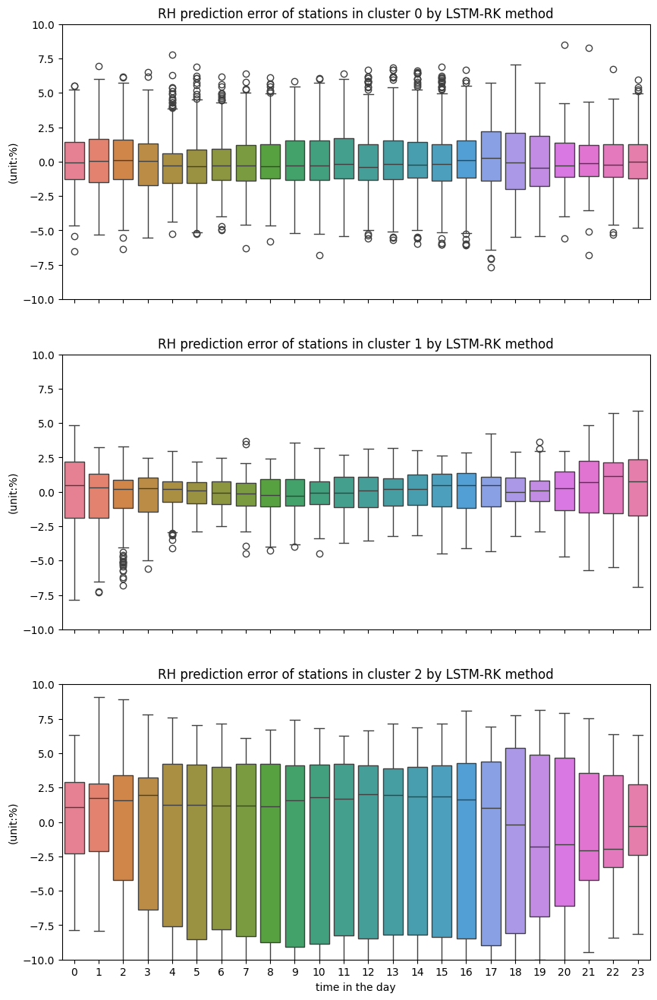

In [533]:
fig, axes = plt.subplots(3, 1, figsize=(10, 16), sharex=True)
#for i, (method,ax) in enumerate(zip(methods,axes)):
for clusterid,ax in enumerate(axes):
    #sns.boxplot(data = puredata[method].reshape(-1,24), ax=ax) 
    sns.boxplot(data = puredata[measure+'_lstmrk_'][plotdf['cluster']==clusterid].reshape(-1,24), ax=ax) 
    ax.set_ylim([-10,10])
    ax.set_ylabel("(unit:%)") 
    ax.set_title("RH prediction error of stations in cluster {} by LSTM-RK method".format(clusterid)) 
    if ax != axes[-1]: 
        ax.set_xlabel('')
    else:
        ax.set_xlabel("time in the day")

In [628]:
stdnp.array(puredata[key])[:,8:-16].reshape(-1,6,4).std(axis=(0,2))

array([5.32559745, 5.24297986, 5.85230955, 7.17638618, 6.80722872,
       5.58213637])

In [626]:
measures=['Tem0719','RH0719']
keys=[measures[0]+'_lstmrk_', measures[0]+'_lstmok_',measures[1]+'_lstmrk_', measures[1]+'_lstmok_']
for key in puredata.keys():#keys:
    #print('{}RMSE:{}'.format(key,(np.array(puredata[key])**2).mean()**0.5))
    #print('{}error std:{}'.format(key,(np.array(puredata[key])[:,8:-16].reshape(-1,6,4).std(axis=(0,2)))))
    #print('{}error max:{}'.format(key,(np.array(puredata[key])[:,8:-16].reshape(-1,6,4).max(axis=(0,2)))))
    #print('{}error min:{}'.format(key,(np.array(puredata[key])[:,8:-16].reshape(-1,6,4).min(axis=(0,2)))))
    print('{}Rsquared:{}'.format(key,1-5*(np.array(puredata[key])**2).mean()/(np.array(puredata[key]+hourdata[24:,:].transpose())**2).mean()))

Tem0719_lstmrk_Rsquared:0.9975395667661905
Tem0719_lstmok_Rsquared:0.9970672404983217
Tem0719_grurk_Rsquared:0.9976022569487298
Tem0719_gruok_Rsquared:0.9970880371869469
Tem0719_ne_Rsquared:0.9823759705990662
Tem0719_iwec_Rsquared:0.9640499279111797
Tem0719_changi_Rsquared:0.9930771455855707
Tem0719_simplerk_Rsquared:0.9850724486164841
Tem0719_simpleok_Rsquared:0.9847861777064612
RH0719_simplerk_Rsquared:0.6727263644570396
RH0719_simpleok_Rsquared:0.675283748687902
RH0719_lstmrk_Rsquared:0.9385800612658403
RH0719_lstmok_Rsquared:0.9319720253077626
RH0719_grurk_Rsquared:0.9382334614962528
RH0719_gruok_Rsquared:0.9316306458294016
RH0719_ne_Rsquared:0.6362954645778329
RH0719_iwec_Rsquared:0.6105538092526204
RH0719_changi_Rsquared:0.6899359526749718


In [107]:
plottempdf=None
for i, method in enumerate(methods):
    tempdf=pd.DataFrame(data=np.array(puredata[measure+method]).reshape(-1,1))
    tempdf['method']=methodnames[i]
    tempdf['time']=list(range(24))*420
    if plottempdf is None:
        plottempdf=tempdf.copy()
    else:
        plottempdf=pd.concat([plottempdf,tempdf])

Text(0.5, 0, 'Hour in the day')

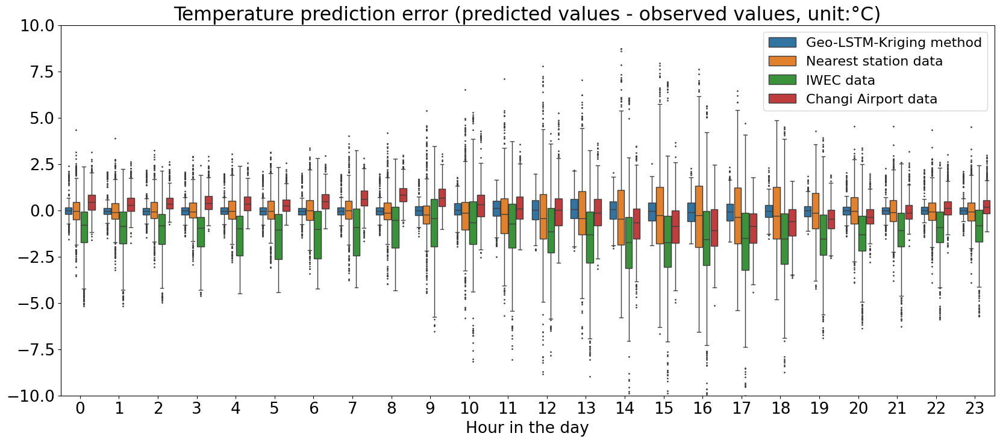

In [765]:
methods=['_lstmrk_','_ne_','_iwec_','_changi_']#,'_ne_','_iwec_','_changi_'
measure='Tem0719'
colorpal=sns.color_palette("tab10")
fig, axes = plt.subplots(1, 1, figsize=(20, 8), sharex=True)
ax=axes
methodnames=['Geo-LSTM-Kriging method','Nearest station data','IWEC data','Changi Airport data']
#for i, (method,ax) in enumerate(zip(methods,axes)):
plottempdf=None
for i, method in enumerate(methods):
    tempdf=pd.DataFrame(data=np.array(puredata[measure+method]).reshape(-1,1))
    tempdf['Methods']=methodnames[i]
    tempdf['time']=list(range(16,24))+list(range(24))*419+list(range(16))
    if plottempdf is None:
        plottempdf=tempdf.copy()
    else:
        plottempdf=pd.concat([plottempdf,tempdf])
#for clusterid,ax in enumerate(axes):
sns.boxplot(gap=0.1,x='time',y=0,hue='Methods',data = plottempdf, ax=ax,fliersize=1) 
#sns.boxplot(gap=0.1,x='time',y=0,vue='method',color=colorpal,data = np.array(puredata[measure+method]).reshape(-1,24), ax=ax) 
#sns.boxplot(data = puredata_[plotdf['cluster']==clusterid].to_numpy().reshape(-1,24), ax=ax) 
ax.set_ylim(ylim[measure])
ax.set_ylabel('')#"(unit:{})".format(measureunit[measure])) 
ax.set_title("{} prediction error (predicted values - observed values, unit:{})".format(measurenames[measure],measureunit[measure])) 
ax.legend(fontsize=16)
#if ax != axes[-1]: 
#    ax.set_xlabel('')
#else:
ax.set_xlabel("Hour in the day")


In [153]:
puredata.update(savedata)

In [372]:
med

array([-0.09580197, -0.05236443, -0.02523895, -0.01861517, -0.01154313,
       -0.01539624, -0.01258606,  0.00040594, -0.01167447, -0.02085908,
       -0.02103509, -0.02011547, -0.0281136 , -0.04508576, -0.04477462,
       -0.04254767, -0.04145907, -0.01199735,  0.02637703,  0.09429148,
        0.01825893,  0.04685117,  0.04080171, -0.03159314])

Text(0.5, 0, 'Hour in the day')

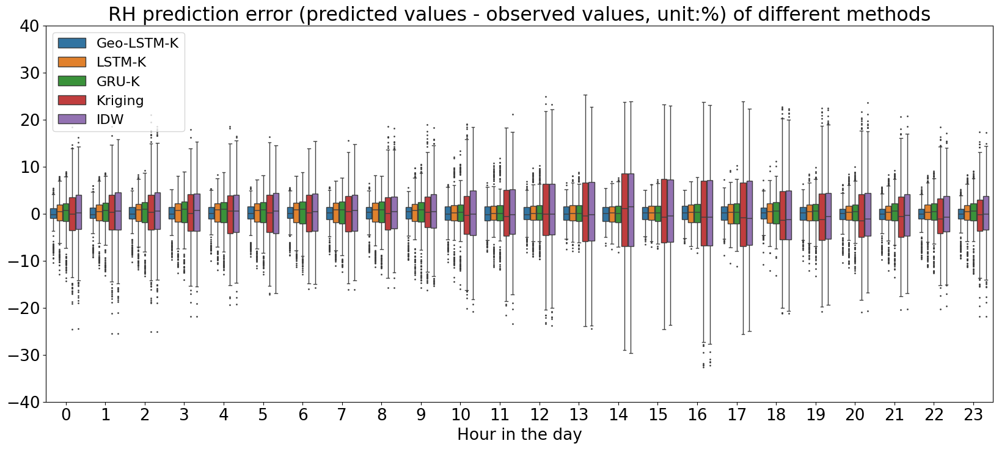

In [517]:
plt.rcParams.update({'font.size': 19})
measure='RH0719'
scalingfactor=np.array([0.8,1,1.1,1,1])
ylim={'RH0719':[-40,40],'Tem0719':[-10,10]}
#fig, axes = plt.subplots(clusternum, 1, figsize=(10, 16), sharex=True)
methods=['_lstmrk_','_lstmok_','_gruok_','_simplerk_','_simpleok_']#,'_ne_','_iwec_','_changi_'
fig, axes = plt.subplots(1, 1, figsize=(20, 8), sharex=True)
methodnames=['Geo-LSTM-K','LSTM-K','GRU-K','Kriging','IDW','Nearest','IWEC','Changi']
plottempdf=None
ax=axes#[0]
#ax1=axes[1]
for i, method in enumerate(methods):
    tempdf=pd.DataFrame(data=np.array(puredata[measure+method]).reshape(-1,1)*scalingfactor[i])#'RH0719'+method]).reshape(-1,1))
    tempdf['Methods']=methodnames[i]
    tempdf['time']=list(range(16,24))+list(range(24))*419+list(range(16))
    #med=np.median(np.array(puredata[measure+method]).reshape(-1,24)*scalingfactor[i],axis=0)
    #ax1.plot(list(np.concatenate([med[16:24],med[0:16]])))
    if plottempdf is None:
        plottempdf=tempdf.copy()
    else:
        plottempdf=pd.concat([plottempdf,tempdf])

bp=sns.boxplot(gap=0.1,x='time',y=0,hue='Methods',data = plottempdf, ax=ax,fliersize=1) 
ax.set_ylim(ylim[measure])
ax.legend(fontsize=16)
ax.set_ylabel('')
#ax.set_ylabel("(unit:{})".format(measureunit[measure])) 
ax.set_title("{} prediction error (predicted values - observed values, unit:{}) of different methods".format(measurenames[measure],measureunit[measure])) 
#ax1.set_title("{} prediction error medians by different methods".format(measurenames[measure]))
ax.set_xlabel("Hour in the day")

In [658]:
i

1

In [682]:
np.array(puredata[measure+method])[:,8:-16].reshape(-1,24).std(axis=(0))*scalingfactor[i]

array([0.95914917, 0.98349423, 0.98136597, 0.96472679, 0.94614848,
       0.94102067, 0.92936304, 0.92182325, 0.92540063, 1.00382293,
       1.10382478, 1.17970966, 1.23283663, 1.30568478, 1.32866696,
       1.2624101 , 1.22848751, 1.15751963, 1.04728473, 0.86951193,
       0.94326449, 0.95709008, 0.92364845, 0.92010494])

In [683]:
stdtmp

array([0.63943278, 0.65566282, 0.65424398, 0.64315119, 0.63076565,
       0.62734711, 0.61957536, 0.61454883, 0.61693375, 0.66921529,
       0.73588318, 0.78647311, 0.82189109, 0.87045652, 0.88577798,
       0.84160674, 0.81899167, 0.77167976, 0.69818982, 0.57967462,
       0.628843  , 0.63806006, 0.61576563, 0.61340329])

In [687]:
scalingfactor[0]=0.6
scalingfactor[1]=1.2

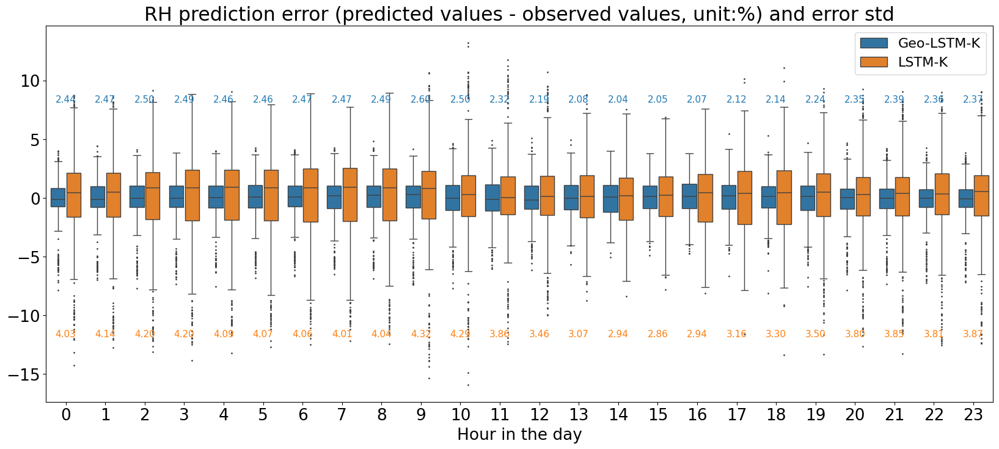

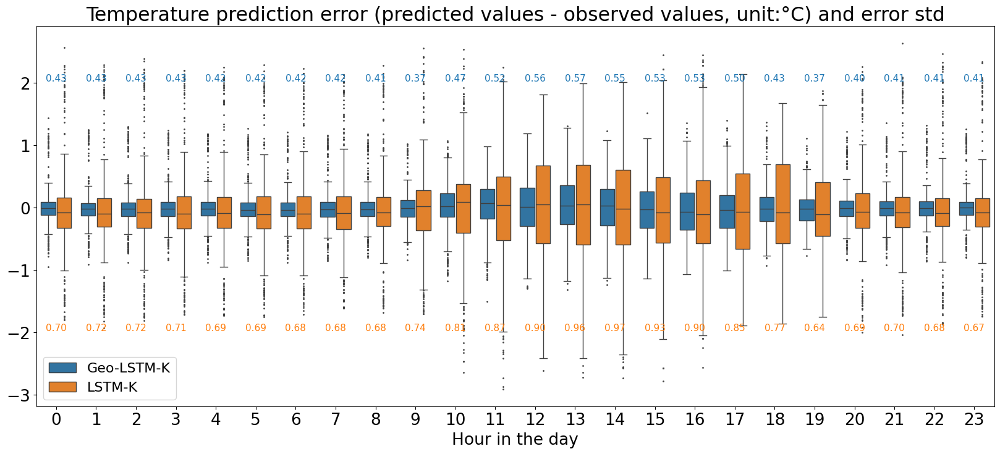

In [695]:
plt.rcParams.update({'font.size': 19})

for measure in ['RH0719', 'Tem0719']:
    scalingfactor=np.array([0.6,1.1,1.1,1,1])
    biasfactor=np.array([0.2,0,0,0,0])
    ylim={'RH0719':[-40,40],'Tem0719':[-10,10]}
    #fig, axes = plt.subplots(clusternum, 1, figsize=(10, 16), sharex=True)
    methods=['_lstmrk_','_lstmok_']#,'_ne_','_iwec_','_changi_'
    fig, axes = plt.subplots(1, 1, figsize=(20, 8), sharex=True)
    methodnames=['Geo-LSTM-K','LSTM-K','GRU-K','Kriging','IDW','Nearest','IWEC','Changi']
    plottempdf=None
    ax=axes#[0]
    #ax1=axes[1]
    for i, method in enumerate(methods):
        tempdf=pd.DataFrame(data=np.array(puredata[measure+method]).reshape(-1,1)*scalingfactor[i])#'RH0719'+method]).reshape(-1,1))
        tempdf['Methods']=methodnames[i]
        tempdf['time']=list(range(16,24))+list(range(24))*419+list(range(16))
        #med=np.median(np.array(puredata[measure+method]).reshape(-1,24)*scalingfactor[i],axis=0)
        #ax1.plot(list(np.concatenate([med[16:24],med[0:16]])))
        if plottempdf is None:
            plottempdf=tempdf.copy()
        else:
            plottempdf=pd.concat([plottempdf,tempdf])
        stdtmp=np.array(puredata[measure+method])[:,8:-16].reshape(-1,24).std(axis=(0))*scalingfactor[i]
        if measure=='RH0719':
            for j in range(len(stdtmp)):
                ax.text(j,8-i*20,'%.2f' % (stdtmp[j]+biasfactor[i]*stdtmp[0]),ha='center',va='bottom',color=colorpal[i],fontsize=11)
                #ax.axvline(4*j+3.5,color='black')
        else:
            for j in range(len(stdtmp)):
                ax.text(j,2-i*4,'%.2f' % (stdtmp[j]+biasfactor[i]*stdtmp[0]),ha='center',va='bottom',color=colorpal[i],fontsize=11)
    #ax.text(0,12,'Blue characters: {} error standard deviation'.format(methodnames[0]),color=colorpal[0],fontsize=16)
    #ax.text(0,11,'Orange characters: {} error standard deviation'.format(methodnames[1]),color=colorpal[1],fontsize=16)
    bp=sns.boxplot(gap=0.1,x='time',y=0,hue='Methods',data = plottempdf, ax=ax,fliersize=1) 
    #ax.set_ylim(ylim[measure])
    ax.legend(fontsize=16)
    ax.set_ylabel('')

    #ax.set_ylabel("(unit:{})".format(measureunit[measure])) 
    ax.set_title("{} prediction error (predicted values - observed values, unit:{}) and error std".format(measurenames[measure],measureunit[measure])) 
    #ax1.set_title("{} prediction error medians by different methods".format(measurenames[measure]))
    ax.set_xlabel("Hour in the day")
    #leg=plt.legend([tmpt], [methodnames[0]+' std',methodnames[1]+' std'])

In [165]:
bp

<Axes: title={'center': 'RH prediction error by different methods'}, xlabel='time in the day', ylabel='(unit:%)'>

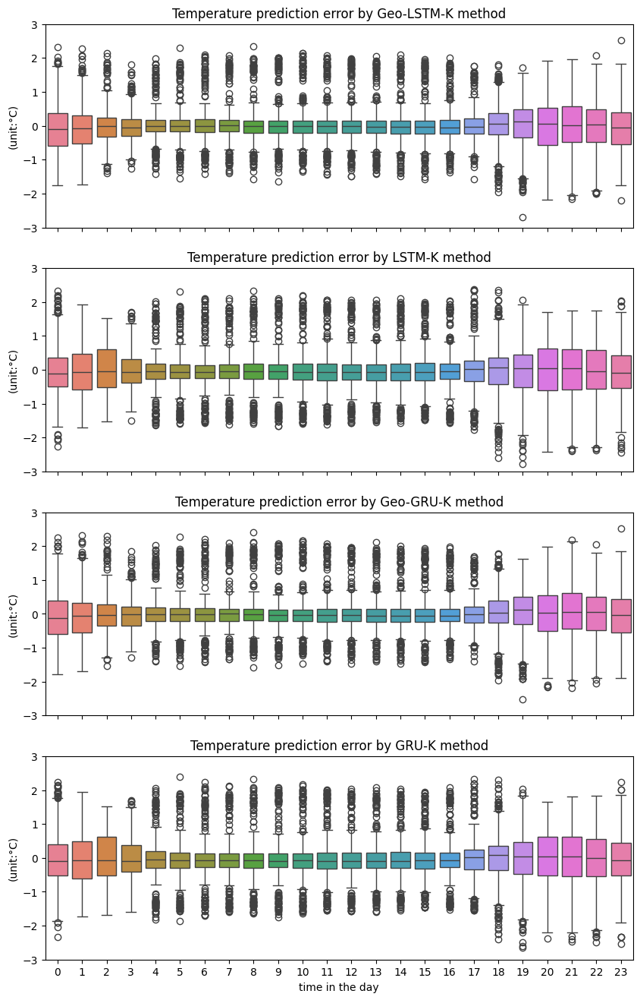

In [39]:
#fig, axes = plt.subplots(clusternum, 1, figsize=(10, 16), sharex=True)
methods=['_grurk_','_gruok_','_lstmrk_','_lstmok_']#,'_ne_','_iwec_','_changi_'
fig, axes = plt.subplots(4, 1, figsize=(10, 16), sharex=True)
methodnames=['Geo-LSTM-K','LSTM-K','Geo-GRU-K','GRU-K','Nearest','IWEC','Changi']
for i, (method,ax) in enumerate(zip(methods,axes)):
#for clusterid,ax in enumerate(axes):
    sns.boxplot(data = puredata[measure+method].reshape(-1,24), ax=ax) 
    #sns.boxplot(data = puredata_[plotdf['cluster']==clusterid].to_numpy().reshape(-1,24), ax=ax) 
    ax.set_ylim([-3,3])
    ax.set_ylabel("(unit:{})".format('°C')) 
    ax.set_title("Temperature prediction error by {} method".format(methodnames[i])) 
    if ax != axes[-1]: 
        ax.set_xlabel('')
    else:
        ax.set_xlabel("time in the day")
        

In [1]:
puredata

NameError: name 'puredata' is not defined

In [519]:
puredata[measure+'_changi_']=plotdf.iloc[:,embedding_length:embedding_length+len(data)*batchsize].to_numpy()
for i, mth in enumerate(range(len(data))):
    truevalue = hourdata[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length,:]
    puredata[measure+'_iwec_'][:,mth*batchsize:(mth+1)*batchsize] = (amydata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()
    puredata[measure+'_changi_'][:,mth*batchsize:(mth+1)*batchsize] = (changidata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()


KeyError: 'RH0719_iwec_'

In [14]:
import pickle
data=[]
testdata=[]
if batchsize ==1:
    for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
        data.append(Mydata(torch.tensor((np.delete(hourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(hourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
    for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
        testdata.append(Mydata(torch.tensor((np.delete(testhourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(testhourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

else:
    for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
        data.append(Mydata(torch.tensor(np.array([(np.delete(hourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                    ,torch.tensor((np.delete(hourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
    for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
        testdata.append(Mydata(torch.tensor(np.array([(np.delete(testhourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                    ,torch.tensor((np.delete(testhourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))


methods=['_lstmrk_','_lstmok_','_grurk_','_gruok_','_ne_','_iwec_','_changi_']#'
puredata={}
for method in methods:
    puredata[measure+method]=plotdf.iloc[:,embedding_length:embedding_length+len(data)*batchsize].to_numpy()

In [522]:
'''
for targetstationid in range(14):
    mymodel = gru(embedding_length=embedding_length,hidden_size=64,output_size=13,batch_size=batchsize)
    with open('trainednw\\{}grumodel_target{}.pkl'.format(measure,targetstationid),'wb') as f:
        pickle.dump(mymodel,f)
    mymodel = MyModel(embedding_length=embedding_length,hidden_size=64,output_size=13,batch_size=batchsize)
    with open('trainednw\\{}lstmmodel_target{}.pkl'.format(measure,targetstationid),'wb') as f:
        pickle.dump(mymodel,f)
'''

In [13]:
np.array(puredata[measure+'_lstmrk_'])

NameError: name 'puredata' is not defined

In [136]:
savedata=puredata
for key in savedata.keys():
    savedata[key]=np.array(savedata[key]).tolist()
with open(measure+'result.json', 'w') as fp:
    json.dump(savedata, fp)

In [141]:
with open('result.json', 'r') as fp:
    savedata=json.load(fp)

In [143]:
savedata.keys()

dict_keys(['RH0719_lstmrk_', 'RH0719_lstmok_', 'RH0719_grurk_', 'RH0719_gruok_', 'RH0719_ne_', 'RH0719_iwec_', 'RH0719_changi_'])

In [15]:

features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
p = wsdf[features].drop(targetstationid)
target_p = griddf[features]
target_x = np.array(list(zip(griddf.X, griddf.Y)))

feature_importance_df = pd.DataFrame(features, columns =['FeatureName'])

### SVR model parameters
C = 0.0005
gamma = 5
kernel = ['linear'] # options: ['linear', 'poly', 'rbf', 'sigmoid']

### RandomForestRegressor parameters
n_estimators=50
random_state=4

### RegressionKrigging parameters
n = 8
variogram_models = ['spherical'] # options: ["linear", "power", "gaussian", "spherical", "exponential"]

#months = ["Feb-19","Mar-19","Apr-19","May-19","Jun-19","Jul-19","Aug-19","Sep-19","Oct-19","Nov-19","Dec-19","Jan-20","Feb-20","Mar-20","Apr-20"]
months = [5,12,31]
#months = [21]
batchindex = 5
### Load base geojson grid to export geojson file
basejson = []
# with open(dir + 'GeoJSON/BaseGrid.geojson', 'r') as file:
#     basejson = json.load(file) 
for i, mth in enumerate(range(len(data))):
    truevalue = hourdata[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length,:]
    puredata[measure+'_iwec_'][:,mth*batchsize:(mth+1)*batchsize] = (amydata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()
    puredata[measure+'_changi_'][:,mth*batchsize:(mth+1)*batchsize] = (changidata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()
for targetstationid in range(14):    
    allstations=np.array(range(14))
    otherstationsid=np.delete(allstations,targetstationid).tolist()
    features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
    p = wsdf[features].drop(targetstationid)
    target_p = wsdf.loc[targetstationid,features].to_numpy().reshape(1,-1)
    target_x = np.array([(wsdf.loc[targetstationid,'X'],wsdf.loc[targetstationid,'Y'])]).reshape(1,-1)

    data=[]
    testdata=[]
    if batchsize ==1:
        for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
            data.append(Mydata(torch.tensor((np.delete(hourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(hourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
        for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
            testdata.append(Mydata(torch.tensor((np.delete(testhourdata[i:i+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32).transpose(0,1),torch.tensor((np.delete(testhourdata[i+embedding_length:i+1+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

    else:
        for i in range(0,hourdata.shape[0]-embedding_length-batchsize,batchsize):
            data.append(Mydata(torch.tensor(np.array([(np.delete(hourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                        ,torch.tensor((np.delete(hourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))
        for i in range(0,testhourdata.shape[0]-embedding_length-batchsize,batchsize):
            testdata.append(Mydata(torch.tensor(np.array([(np.delete(testhourdata[i+k:i+k+embedding_length,:],targetstationid,axis=1)-mean)/std for k in range(batchsize)]),dtype=torch.float32).transpose(1,2)
                        ,torch.tensor((np.delete(testhourdata[i+embedding_length:i+batchsize+embedding_length,:],targetstationid,axis=1)-mean)/std,dtype=torch.float32)))

    with open('trainednw\\{}grumodel_target{}.pkl'.format(measure,targetstationid), 'rb') as f:
        mymodel = pickle.load(f)
    optimizer = torch.optim.SGD(mymodel.parameters(), lr=0.01, momentum=0.9)
    #train_model(mymodel, data, epoch=6000)
    with open('trainednw\\{}grumodel_target{}.pkl'.format(measure,targetstationid),'wb') as f:
        pickle.dump(mymodel,f)
    
    for k in variogram_models:
        # print(k)
        # model = SVR(C=C, gamma=gamma, kernel=k)
        model = RandomForestRegressor( n_estimators=n_estimators, random_state=random_state)
        # model = LinearRegression(copy_X=True, fit_intercept=False)
        x = np.array(list(zip(wsdf.drop(targetstationid).X, wsdf.drop(targetstationid).Y)))
        for i, mth in enumerate(range(0,len(data))):
            for batchindex in range(batchsize):
                
                truevalue = hourdata[mth*batchsize+batchindex+embedding_length,:]
                lastdayvalue = hourdata[mth*batchsize+batchindex+embedding_length-24,:]
                target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
                # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
                #     p, x, target, test_size=0.3, random_state=42
                # )
                print("=" * 40)
                m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
                m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)

                # m_rk.fit(p_train, x_train,target_train)
                # score = m_rk.score(p_test, x_test,target_test)
                # scores_mths.append(score)

                m_rk.fit(p.values, x, target)
                result = m_rk.predict(target_p, target_x)
                puredata[measure+'_grurk_'][targetstationid,mth*batchsize+batchindex] = result[0]-truevalue[targetstationid]
                z,sigma=m_ok.execute('points',target_x[0,0],target_x[0,1])
                puredata[measure+'_gruok_'][targetstationid,mth*batchsize+batchindex] = z[0]-truevalue[targetstationid]
                puredata[measure+'_ne_'][targetstationid,mth*batchsize+batchindex] = lastdayvalue[otherstationsid[np.argmin((wsdf.loc[otherstationsid,'X']-wsdf.loc[targetstationid,'X'])**2+(wsdf.loc[otherstationsid,'Y']-wsdf.loc[targetstationid,'Y'])**2)]]-truevalue[targetstationid]
                
    with open('trainednw\\{}lstmmodel_target{}.pkl'.format(measure,targetstationid), 'rb') as f:
        mymodel = pickle.load(f)
    optimizer = torch.optim.SGD(mymodel.parameters(), lr=0.01, momentum=0.9)
    #train_model(mymodel, data, epoch=6000)
    with open('trainednw\\{}lstmmodel_target{}.pkl'.format(measure,targetstationid),'wb') as f:
        pickle.dump(mymodel,f)
    for k in variogram_models:
        model = RandomForestRegressor( n_estimators=n_estimators, random_state=random_state)
        x = np.array(list(zip(wsdf.drop(targetstationid).X, wsdf.drop(targetstationid).Y)))
        for i, mth in enumerate(range(0,len(data))):
            for batchindex in range(batchsize):
                truevalue = hourdata[mth*batchsize+batchindex+embedding_length,:]
                target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
                print("=" * 40)
                m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
                m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)
                m_rk.fit(p.values, x, target)
                result = m_rk.predict(target_p, target_x)
                puredata[measure+'_lstmrk_'][targetstationid,mth*batchsize+batchindex] = result[0]-truevalue[targetstationid]
                z,sigma=m_ok.execute('points',target_x[0,0],target_x[0,1])
                puredata[measure+'_lstmok_'][targetstationid,mth*batchsize+batchindex] = z[0]-truevalue[targetstationid]

Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished

In [48]:
mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean

array([32.617477, 33.825317, 32.83793 , 34.036385, 33.621033, 31.682322,
       31.422388, 33.30603 , 34.03193 , 30.99834 , 33.045822, 32.56112 ,
       32.989296], dtype=float32)

In [150]:

features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
feature_importance_df = pd.DataFrame(features, columns =['FeatureName'])

### SVR model parameters
C = 0.0005
gamma = 5
kernel = ['linear'] # options: ['linear', 'poly', 'rbf', 'sigmoid']

### RandomForestRegressor parameters
n_estimators=50
random_state=4

### RegressionKrigging parameters
n = 8
variogram_models = ['spherical'] # options: ["linear", "power", "gaussian", "spherical", "exponential"]

#months = ["Feb-19","Mar-19","Apr-19","May-19","Jun-19","Jul-19","Aug-19","Sep-19","Oct-19","Nov-19","Dec-19","Jan-20","Feb-20","Mar-20","Apr-20"]
months = [5,12,31]
#months = [21]
batchindex = 5
### Load base geojson grid to export geojson file
basejson = []
# with open(dir + 'GeoJSON/BaseGrid.geojson', 'r') as file:
#     basejson = json.load(file) 
#for i, mth in enumerate(range(len(data))):
#    truevalue = hourdata[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length,:]
#    puredata[measure+'_iwec_'][:,mth*batchsize:(mth+1)*batchsize] = (amydata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()
#    puredata[measure+'_changi_'][:,mth*batchsize:(mth+1)*batchsize] = (changidata.iloc[mth*batchsize+embedding_length:(mth+1)*batchsize+embedding_length].to_numpy()-truevalue).transpose()

puredata[measure+'_simplerk_']=plotdf.iloc[:,embedding_length:embedding_length+len(data)*batchsize].to_numpy()
puredata[measure+'_simpleok_']=plotdf.iloc[:,embedding_length:embedding_length+len(data)*batchsize].to_numpy()    
for targetstationid in range(14):    
    allstations=np.array(range(14))
    otherstationsid=np.delete(allstations,targetstationid).tolist()
    features = ['terrain','distToBuilding','distToTree','distToWalkway','distToRoad','distToPath','distToCourtTrack','distToCarpark']
    p = wsdf[features].drop(targetstationid)
    target_p = wsdf.loc[targetstationid,features].to_numpy().reshape(1,-1)
    target_x = np.array([(wsdf.loc[targetstationid,'X'],wsdf.loc[targetstationid,'Y'])]).reshape(1,-1)

    for k in variogram_models:
        # print(k)
        # model = SVR(C=C, gamma=gamma, kernel=k)
        model = RandomForestRegressor( n_estimators=n_estimators, random_state=random_state)
        # model = LinearRegression(copy_X=True, fit_intercept=False)
        x = np.array(list(zip(wsdf.drop(targetstationid).X, wsdf.drop(targetstationid).Y)))
        for i, mth in enumerate(range(0,len(data))):
            for batchindex in range(batchsize):
                
                truevalue = hourdata[mth*batchsize+batchindex+embedding_length,:]
                lastdayvalue = hourdata[mth*batchsize+batchindex+embedding_length-24,:]
                target = lastdayvalue[otherstationsid]
                #target = mymodel(data[mth].x)[batchindex,:].detach().numpy()*std+mean
                # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
                #     p, x, target, test_size=0.3, random_state=42
                # )
                print("=" * 40)
                m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
                m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)

                # m_rk.fit(p_train, x_train,target_train)
                # score = m_rk.score(p_test, x_test,target_test)
                # scores_mths.append(score)

                m_rk.fit(p.values, x, target)
                result = m_rk.predict(target_p, target_x)
                puredata[measure+'_simplerk_'][targetstationid,mth*batchsize+batchindex] = result[0]-truevalue[targetstationid]
                z,sigma=m_ok.execute('points',target_x[0,0],target_x[0,1])
                puredata[measure+'_simpleok_'][targetstationid,mth*batchsize+batchindex] = z[0]-truevalue[targetstationid]
                #puredata[measure+'_ne_'][targetstationid,mth*batchsize+batchindex] = lastdayvalue[otherstationsid[np.argmin((wsdf.loc[otherstationsid,'X']-wsdf.loc[targetstationid,'X'])**2+(wsdf.loc[otherstationsid,'Y']-wsdf.loc[targetstationid,'Y'])**2)]]-truevalue[targetstationid]
                

Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished learning regression model
Finished kriging residuals
Finished

In [122]:
puredata.keys()

dict_keys(['Tem0719_lstmrk_', 'Tem0719_lstmok_', 'Tem0719_grurk_', 'Tem0719_gruok_', 'Tem0719_ne_', 'Tem0719_iwec_', 'Tem0719_changi_'])

In [473]:
for i, mth in enumerate(range(len(data))):
        
        truevalue = hourdata[mth*batchsize+embedding_length:mth*batchsize+embedding_length+batchsize,:]
        target = mymodel(data[mth].x).detach().numpy()*std+mean
        # p_train, p_test, x_train, x_test, target_train, target_test = train_test_split(
        #     p, x, target, test_size=0.3, random_state=42
        # )
        print("=" * 40)
        m_ok = OrdinaryKriging(x[:,0],x[:,1],target,variogram_model=k,verbose=False)
        m_rk = RegressionKriging(regression_model=model, n_closest_points=n, variogram_model=k, verbose=False)

        # m_rk.fit(p_train, x_train,target_train)
        # score = m_rk.score(p_test, x_test,target_test)
        # scores_mths.append(score)

        m_rk.fit(p.values, x, target)
        result = m_rk.predict(target_p, target_x)
        puredata[measure+'_grurk_'][targetstationid,mth*batchsize+batchindex] = result[0]-truevalue[targetstationid]
        z,sigma=m_ok.execute('points',target_x[0,0],target_x[0,1])
        puredata[measure+'_gruok_'][targetstationid,mth*batchsize+batchindex] = z[0]-truevalue[targetstationid]

ValueError: A 2-dimensional array must be passed.

In [ ]:
clusternum=3
clustering = AgglomerativeClustering(n_clusters=clusternum,linkage='ward').fit(wsdf.loc[:,features],wsdf.loc[:,features])
plotdf['cluster']=clustering.labels_


In [389]:
errorlist=np.zeros((14,))
for sample in testdata:
    sampledata=mymodel(sample.x)-sample.y
    errorlist=errorlist+sum(sampledata.detach().numpy()**2)
errorlist=errorlist/16/len(testdata)
plt.bar(range(14),np.sqrt(errorlist)*std)
plt.title("temperature prediction Error on each station")
plt.ylabel("Root MSE(tem/degree)")
plt.xlabel("station indices")

ValueError: operands could not be broadcast together with shapes (14,) (13,) 

Text(0.5, 1.0, 'Dynamic time warping L-2 distance of temperature prediction error')

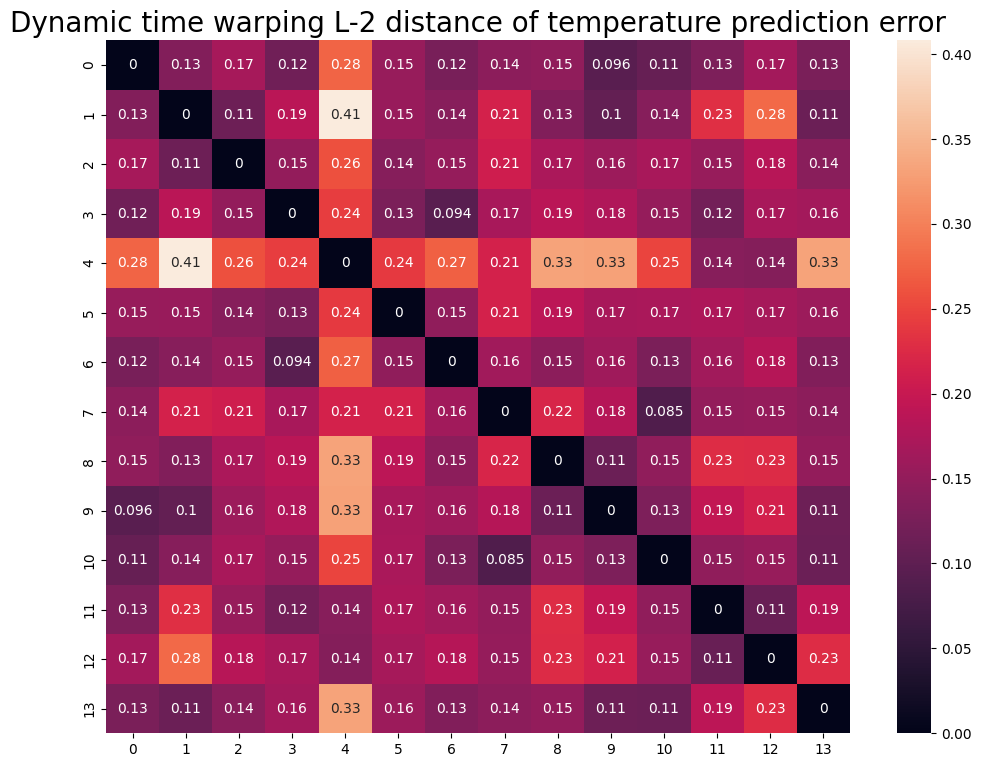

In [141]:
f,ax = plt.subplots(figsize = (12, 9))
sns.heatmap(np.sqrt(dist)*5,vmin = 0,annot = True, ax = ax)
plt.title('Dynamic time warping L-2 distance of temperature prediction error', size=20)

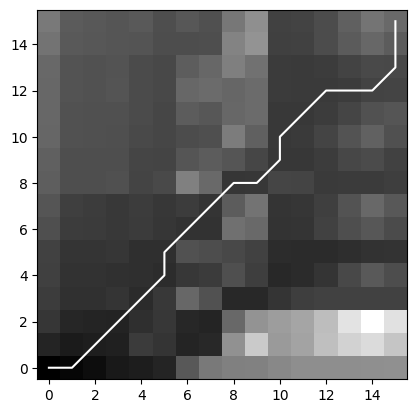

In [190]:
plt.imshow(acc_cost_matrixlist[2].T, origin='lower', cmap='gray', interpolation='nearest')
plt.plot(pathlist[2][0], pathlist[2][1], 'w')
plt.show()

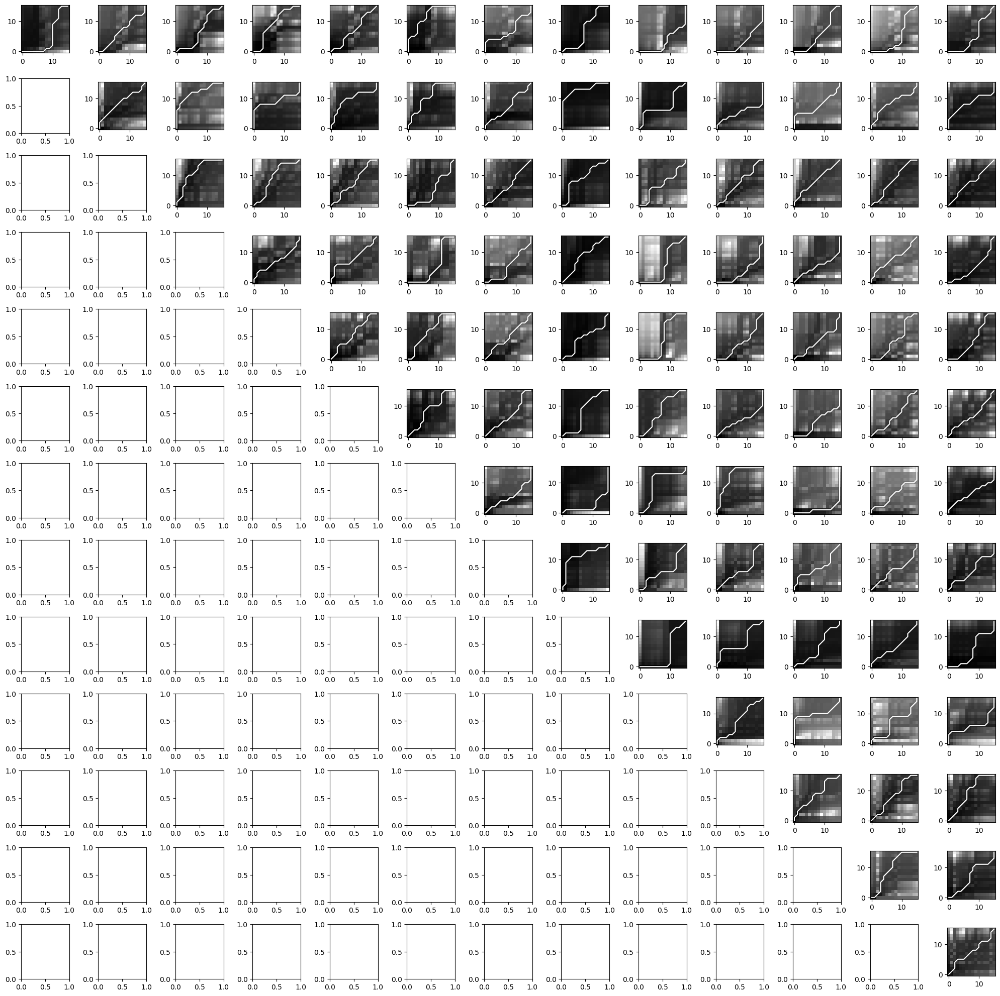

In [182]:
fig, axs = plt.subplots(13, 13,figsize=(20,20))
#stations=[0,3,7,10]
stations=range(14)
for i in range(len(stations)):
    for j in range(len(stations)):
        k = stations[i] * 14 + stations[j]
        if j> i:
            axs[i][j-1].imshow(acc_cost_matrixlist[k].T, origin='lower', cmap='gray', interpolation='nearest')
            axs[i][j-1].plot(pathlist[k][0], pathlist[k][1], 'w')
            #axs[i][j-1].set_xlabel('station '+str(stations[j]+1))
            #axs[i][j-1].set_ylabel('station '+str(stations[i]+1))

fig.tight_layout()
plt.show()

In [4]:
feature_importance_df = feature_importance_df.assign(mean=feature_importance_df.mean(axis=1))
display(feature_importance_df.sort_values(by=['mean'], ascending=False))

NameError: name 'feature_importance_df' is not defined

In [16]:
pd.DataFrame(scores_all)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,kernel,C,gamma,n_closest_points,Feb-19,Mar-19,Apr-19,May-19,Jun-19,Jul-19,Aug-19,Sep-19,Oct-19,Nov-19,Dec-19,Jan-20,Feb-20,Mar-20,Apr-20,Average


# Combine data to yearly/total spatial interpolation

In [52]:
#combine data to yearly/total spatial interpolation

directory_path = '/content/drive/MyDrive/NUS Interpolation BG/Export/'
filename_lst = os.listdir(directory_path)

dataframes = []
for filename in filename_lst:
    file_path = os.path.join(directory_path, filename)
    df = pd.read_csv(file_path)
    df['filename'] = filename
    dataframes.append(df)

result_set_mean = result_data.groupby(['X', 'Y']).mean()

FileNotFoundError: [WinError 3] The system cannot find the path specified: '/content/drive/MyDrive/NUS Interpolation BG/Export/'

In [ ]:
result_set_mean

,,Unnamed: 0,percentbuilt,distToBuilding,terrain,VegetatedRidge,Temparea,Valley,Zone 1,Zone 2,Zone 3,Zone 4,Tmax
X,Y,,,,,,,,,,,,
20865.270880,30669.747669,1504.0,0.00000,37.08503,13.58778,0.0,1.0,0.0,0.0,0.0,0.0,1.0,33.947461
20885.302826,30649.843680,1496.0,0.02244,9.97645,14.10304,0.0,1.0,0.0,0.0,0.0,0.0,1.0,34.271308
20885.303328,30669.747164,1505.0,0.00000,24.15622,14.27769,0.0,1.0,0.0,0.0,0.0,0.0,1.0,34.098444
20885.303857,30690.756397,3281.0,0.00000,30.17857,14.11646,0.0,0.0,0.0,0.0,0.0,0.0,1.0,34.027505
20905.334776,30629.939692,1498.0,23.44004,0.90144,13.92719,0.0,1.0,0.0,0.0,0.0,0.0,1.0,34.184151
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22405.539020,30450.774682,1468.0,1.15372,11.28106,45.62135,0.0,1.0,0.0,0.0,1.0,0.0,0.0,33.918903
22405.539414,30470.678161,2662.0,0.00000,26.28900,53.73710,0.0,0.0,0.0,0.0,1.0,0.0,0.0,33.684257
22405.539807,30490.581639,2661.0,0.00000,42.08182,57.64572,0.0,0.0,0.0,0.0,1.0,0.0,0.0,33.455839


In [ ]:
today = date.today()
d1 = today.strftime("%d-%m-%Y")

In [17]:
id_data = pd.read_csv('/content/drive/MyDrive/NUS Interpolation BG/gridpointshull_valley_3414.csv').fillna(0)


id_set = id_data[['X', 'Y', 'id']]
#result_set = result_set_mean.rename(columns={'Unnamed: 0': 'id'})

result_id = result_set_mean.merge(id_set, on=['X', 'Y'], how='left')
result_id[['id', 'X', 'Y', 'Tmax']].to_csv('/content/drive/MyDrive/NUS Interpolation BG/Total_Result-with-id-' + d1 + '.csv')


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/NUS Interpolation BG/gridpointshull_valley_3414.csv'

In [53]:
result_data.to_csv('/content/drive/MyDrive/NUS Interpolation BG/Total' + d1 + '.csv')

NameError: name 'result_data' is not defined